# Feature engineering - feature analysis  | Sebislaw

## Libraries

In [1]:
from os.path  import join
import random
import itertools
import math

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import plotly.express as px
from pandas.plotting import parallel_coordinates
import seaborn as sns
import ipywidgets as widgets
from IPython.display import display

from sklearn.linear_model import LinearRegression, LassoCV, LogisticRegression, LogisticRegressionCV
from sklearn.model_selection import train_test_split, TimeSeriesSplit, cross_val_score, StratifiedKFold, RandomizedSearchCV
import statsmodels.api as sm
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import brier_score_loss
from sklearn.feature_selection import SelectFromModel
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.calibration import CalibratedClassifierCV
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import mutual_info_classif
from scipy.stats import pearsonr, spearmanr
import xgboost as xgb
from xgboost import XGBClassifier
import optuna
# from tabpfn import TabPFNClassifier

import warnings
np.warnings = warnings
warnings.filterwarnings('ignore')

## Data

In [109]:
data_path = '../../data/'
pd.set_option('display.max_columns', None)

elo = pd.read_csv(join(data_path, 'final_elo_team.csv'))
# elo['CoachELO'] = elo['CoachELO'].fillna(elo['CoachELO'].mean())
# elo = elo.drop(['CoachName'], axis=1)

# The Basics ------------------------------------------------------------------------
# Men
MTeams = pd.read_csv(join(data_path, 'MTeams.csv'))
MSeasons = pd.read_csv(join(data_path, 'MSeasons.csv'))
MNCAATourneySeeds = pd.read_csv(join(data_path, 'MNCAATourneySeeds.csv'))
MRegularSeasonCompactResults = pd.read_csv(join(data_path, 'MRegularSeasonCompactResults.csv'))
MNCAATourneyCompactResults = pd.read_csv(join(data_path, 'MNCAATourneyCompactResults.csv'))
# Women
WTeams = pd.read_csv(join(data_path, 'WTeams.csv'))
WSeasons = pd.read_csv(join(data_path, 'WSeasons.csv'))
WNCAATourneySeeds = pd.read_csv(join(data_path, 'WNCAATourneySeeds.csv'))
WRegularSeasonCompactResults = pd.read_csv(join(data_path, 'WRegularSeasonCompactResults.csv'))
WNCAATourneyCompactResults = pd.read_csv(join(data_path, 'WNCAATourneyCompactResults.csv'))
# Other
SampleSubmissionStage1 = pd.read_csv(join(data_path, 'SampleSubmissionStage1.csv'))
SampleSubmissionStage2 = pd.read_csv(join(data_path, 'SampleSubmissionStage2.csv'))
SeedBenchmarkStage1 = pd.read_csv(join(data_path, 'SeedBenchmarkStage1.csv'))

# Team Box Scores ------------------------------------------------------------------------
# Men
MRegularSeasonDetailedResults = pd.read_csv(join(data_path, 'MRegularSeasonDetailedResults.csv'))
MNCAATourneyDetailedResults = pd.read_csv(join(data_path, 'MNCAATourneyDetailedResults.csv'))
# Women
WRegularSeasonDetailedResults = pd.read_csv(join(data_path, 'WRegularSeasonDetailedResults.csv'))
WNCAATourneyDetailedResults = pd.read_csv(join(data_path, 'WNCAATourneyDetailedResults.csv'))

# Geography ------------------------------------------------------------------------
# All
Cities = pd.read_csv(join(data_path, 'Cities.csv'))
Conferences = pd.read_csv(join(data_path, 'Conferences.csv'))
# Men
MGameCities = pd.read_csv(join(data_path, 'MGameCities.csv'))
# Women
WGameCities = pd.read_csv(join(data_path, 'WGameCities.csv'))

# Public Rankings ------------------------------------------------------------------------
# Men
MMasseyOrdinals = pd.read_csv(join(data_path, 'MMasseyOrdinals.csv')) # men only

# Supplements ------------------------------------------------------------------------
# Men
MTeamCoaches = pd.read_csv(join(data_path, 'MTeamCoaches.csv')) # men only
MTeamConferences = pd.read_csv(join(data_path, 'MTeamConferences.csv'))
MConferenceTourneyGames = pd.read_csv(join(data_path, 'MConferenceTourneyGames.csv'))
MSecondaryTourneyTeams = pd.read_csv(join(data_path, 'MSecondaryTourneyTeams.csv'))
MSecondaryTourneyCompactResults = pd.read_csv(join(data_path, 'MSecondaryTourneyCompactResults.csv'))
MTeamSpellings = pd.read_csv(join(data_path, "MTeamSpellings.csv"), encoding='cp1252')
MNCAATourneySlots = pd.read_csv(join(data_path, 'MNCAATourneySlots.csv'))
MNCAATourneySeedRoundSlots = pd.read_csv(join(data_path, 'MNCAATourneySeedRoundSlots.csv')) # men only
# Women
WTeamConferences = pd.read_csv(join(data_path, 'WTeamConferences.csv'))
WConferenceTourneyGames = pd.read_csv(join(data_path, 'WConferenceTourneyGames.csv'))
WSecondaryTourneyTeams = pd.read_csv(join(data_path, 'WSecondaryTourneyTeams.csv'))
WSecondaryTourneyCompactResults = pd.read_csv(join(data_path, 'WSecondaryTourneyCompactResults.csv'))
WTeamSpellings = pd.read_csv(join(data_path, 'WTeamSpellings.csv'), encoding='cp1252')
WNCAATourneySlots = pd.read_csv(join(data_path, 'WNCAATourneySlots.csv'))

## Data preparation pipeline

In [110]:
def prepare_data(df):
        
    """
    This function duplicates and flips a game record.
    Now two records with the same data are present, 
    but viewed from perspectives of two different teams.
    """
    
    df = df[[
         'Season', 'DayNum', 'NumOT',
         'WTeamID',  'WScore', 'WLoc',
         'WFGM', 'WFGA', 'WFGM3', 'WFGA3', 'WFTM', 'WFTA', 'WOR', 'WDR', 'WAst', 'WTO', 'WStl', 'WBlk', 'WPF',
         'LTeamID', 'LScore',
         'LFGM', 'LFGA', 'LFGM3', 'LFGA3', 'LFTM', 'LFTA', 'LOR', 'LDR', 'LAst', 'LTO', 'LStl', 'LBlk', 'LPF'
    ]]
    dfswap = df[[
         'Season', 'DayNum', 'NumOT',
         'LTeamID', 'LScore', 'WLoc',
         'LFGM', 'LFGA', 'LFGM3', 'LFGA3', 'LFTM', 'LFTA', 'LOR', 'LDR', 'LAst', 'LTO', 'LStl', 'LBlk', 'LPF',
         'WTeamID',  'WScore',
         'WFGM', 'WFGA', 'WFGM3', 'WFGA3', 'WFTM', 'WFTA', 'WOR', 'WDR', 'WAst', 'WTO', 'WStl', 'WBlk', 'WPF',
    ]].copy()
    
    dfswap.loc[df['WLoc'] == 'H', 'WLoc'] = 'A'
    dfswap.loc[df['WLoc'] == 'A', 'WLoc'] = 'H'
        
    df = df.rename(columns={'WLoc': 'location'})
    dfswap = dfswap.rename(columns={'WLoc': 'location'})
        
    df.columns = [x.replace('W','T1_').replace('L','T2_') for x in list(df.columns)]
    dfswap.columns = [x.replace('L','T1_').replace('W','T2_') for x in list(dfswap.columns)]
    
    output = pd.concat([df, dfswap]).reset_index(drop=True)
    output.loc[output.location=='N','location'] = '0'
    output.loc[output.location=='H','location'] = '1'
    output.loc[output.location=='A','location'] = '-1'
    output.location = output.location.astype(int)
        
    output['PointDiff'] = output['T1_Score'] - output['T2_Score']
    
    return output

def get_data(regular_results, tourney_results, seeds, prepared=False, location_multiplier=[1, 1], win_ratio_days_back=14):

    """
    This function uses the prepare_data function in order to create
    a data frame with season statistics for each team.
    These statistics are added to records with games played in
    tournament to make data 'x' used in model to predict the game 
    result 'y'. The output is a data frame that contains data 'x'
    and also label 'y' can be easily calculated based on score difference in matches.
    """

    if prepared:
        regular_data = regular_results.copy()
        tourney_data = tourney_results.copy()
    else:
        # make data frames with extra rows to represent the perspective of losing team
        regular_data = prepare_data(regular_results)
        tourney_data = prepare_data(tourney_results)

    # ----------------------------------- Add reward/penalty for playing in home or away
    if location_multiplier[0] == 1 and location_multiplier[1] == 1:
        # data frame with mean game statistics for a given team in a given season
        season_statistics  = regular_data.groupby(["Season", 'T1_TeamID'])[
            [
                'T1_Score', 'T1_FGM','T1_FGA','T1_FGM3','T1_FGA3','T1_FTM','T1_FTA',
                'T1_OR','T1_DR','T1_Ast','T1_TO','T1_Stl','T1_Blk','T1_PF',
                'T2_Score', 'T2_FGM','T2_FGA','T2_FGM3','T2_FGA3','T2_FTM','T2_FTA',
                'T2_OR','T2_DR','T2_Ast','T2_TO','T2_Stl','T2_Blk','T2_PF',
                'PointDiff'
            ]
        ].agg('mean').reset_index()
    else:
        # Define which columns to adjust (you can add or remove columns as needed)
        T1_cols = ['T1_Score','T1_FGM','T1_FGA','T1_FGM3','T1_FGA3','T1_FTM','T1_FTA','T1_OR','T1_DR','T1_Ast','T1_TO','T1_Stl','T1_Blk','T1_PF']
        T2_cols = ['T2_Score','T2_FGM','T2_FGA','T2_FGM3','T2_FGA3','T2_FTM','T2_FTA','T2_OR','T2_DR','T2_Ast','T2_TO','T2_Stl','T2_Blk','T2_PF']
    
        # Convert the relevant columns to float before applying the adjustment function.
        cols_to_float = T1_cols + T2_cols
        regular_data[cols_to_float] = regular_data[cols_to_float].astype(float)
        
        def adjust_stats(row):
            # Determine multipliers based on location
            if row['location'] == 1:
                factor_T1 = location_multiplier[0]  # penalize Team1 stats (home)
                factor_T2 = location_multiplier[1]  # boost Team2 stats
            elif row['location'] == -1:
                factor_T1 = location_multiplier[1]  # boost Team1 stats (away)
                factor_T2 = location_multiplier[0]  # penalize Team2 stats
            else:
                factor_T1 = 1.0
                factor_T2 = 1.0
        
            # Adjust Team1 stats
            for col in T1_cols:
                if col in row and pd.notnull(row[col]):
                    row[col] = row[col] * factor_T1
        
            # Adjust Team2 stats
            for col in T2_cols:
                if col in row and pd.notnull(row[col]):
                    row[col] = row[col] * factor_T2
        
            # Recalculate derived statistics (if needed)
            if 'T1_Score' in row and 'T2_Score' in row:
                row['PointDiff'] = row['T1_Score'] - row['T2_Score']
            return row
        
        # Apply the adjustment function row-wise.
        regular_data_adjusted = regular_data.apply(adjust_stats, axis=1)
        
        # Now group by Season and T1_TeamID to compute season averages for the adjusted statistics.
        stats_columns = T1_cols[1:] + T2_cols[1:] + ['PointDiff']  # Exclude T1_TeamID from stats if present.
        season_statistics = regular_data_adjusted.groupby(["Season", 'T1_TeamID'])[stats_columns].agg('mean').reset_index()
    # -----------------------------------
    
    # mean statistics for team and team's opponent's
    season_statistics_T1 = season_statistics.copy()
    season_statistics_T2 = season_statistics.copy()
    
    season_statistics_T1.columns = ["T1_" + x.replace("T1_","").replace("T2_","opponent_") for x in list(season_statistics_T1.columns)]
    season_statistics_T2.columns = ["T2_" + x.replace("T1_","").replace("T2_","opponent_") for x in list(season_statistics_T2.columns)]
    season_statistics_T1.columns.values[0] = "Season"
    season_statistics_T2.columns.values[0] = "Season"
    season_statistics_T1 = season_statistics_T1.rename(columns={'T1_Score': 'T1_Score_mean'})
    season_statistics_T2 = season_statistics_T2.rename(columns={'T2_Score': 'T2_Score_mean'})
    
    # data frame containing game's result
    tourney_data = tourney_data[['Season', 'DayNum', 'T1_TeamID', 'T1_Score', 'T2_TeamID' ,'T2_Score', 'location']]
    tourney_data = pd.merge(tourney_data, season_statistics_T1, on = ['Season', 'T1_TeamID'], how = 'left')
    tourney_data = pd.merge(tourney_data, season_statistics_T2, on = ['Season', 'T2_TeamID'], how = 'left')

    calculate_win_ratio_days_back = 132 - win_ratio_days_back
    
    # data frame with win fraction from last x days for a given team in a given season
    last14days_stats_T1 = regular_data.loc[regular_data.DayNum>calculate_win_ratio_days_back].reset_index(drop=True)
    last14days_stats_T1['win'] = np.where(last14days_stats_T1['PointDiff']>0,1,0)
    last14days_stats_T1 = last14days_stats_T1.groupby(['Season','T1_TeamID'])['win'].mean().reset_index(name='T1_win_ratio_14d')
    
    last14days_stats_T2 = regular_data.loc[regular_data.DayNum>calculate_win_ratio_days_back].reset_index(drop=True)
    last14days_stats_T2['win'] = np.where(last14days_stats_T2['PointDiff']<0,1,0)
    last14days_stats_T2 = last14days_stats_T2.groupby(['Season','T2_TeamID'])['win'].mean().reset_index(name='T2_win_ratio_14d')
    
    # add to tourney_data column with win fraction for winning and losing team
    tourney_data = pd.merge(tourney_data, last14days_stats_T1, on = ['Season', 'T1_TeamID'], how = 'left')
    tourney_data = pd.merge(tourney_data, last14days_stats_T2, on = ['Season', 'T2_TeamID'], how = 'left')
    
    # get seeds with no regional division
    seeds['seed'] = seeds['Seed'].apply(lambda x: int(x[1:3]))
    
    # give each team a raw seed
    seeds_T1 = seeds[['Season','TeamID','seed']].copy()
    seeds_T2 = seeds[['Season','TeamID','seed']].copy()
    seeds_T1.columns = ['Season','T1_TeamID','T1_seed']
    seeds_T2.columns = ['Season','T2_TeamID','T2_seed']
    
    # add seeds to turney data for team 1 and team 2
    tourney_data = pd.merge(tourney_data, seeds_T1, on = ['Season', 'T1_TeamID'], how = 'left')
    tourney_data = pd.merge(tourney_data, seeds_T2, on = ['Season', 'T2_TeamID'], how = 'left')
    
    # add a seed difference column
    tourney_data["Seed_diff"] = tourney_data["T1_seed"] - tourney_data["T2_seed"]

    return tourney_data

def get_df(seeds,
            season_games, season_range, days_back,
            tourney_games, tourney_range, 
            location_multiplier=[1, 1],
           win_ratio_days_back=14):

    """
    This function uses get_data function to get a data
    frame which is then used to make 'x' and 'y' data
    used in models.
    """
    
    # Get from regular season games from specified season range and days back
    # The results of those games will be used as team statictics (additional team information for tourney games)
    regular_results = season_games[season_games['Season'].isin(season_range)]
    regular_results = regular_results[regular_results['DayNum'] > 134 - days_back]
    
    # Get tourney games from a specified season
    # The results of those games will be used as labels
    tourney_results = tourney_games[tourney_games['Season'].isin(tourney_range)]
    
    # Get final data frame
    df = get_data(regular_results, tourney_results, seeds, location_multiplier=[1, 1], win_ratio_days_back=win_ratio_days_back)
    
    return df

def get_final_df(seeds,
                   season_games, season_range, days_back,
                   tourney_games, tourney_range, 
                   SampleSubmissionStage1,
                  location_multiplier=[1, 1],
                win_ratio_days_back=14):

    """
    This function works the same as function get_x_y,
    but also creates (at the moment it's the same as get_x_y)
    aditional data points mostly with NaN values that matches
    the submission format (parsed team matchups with the sample submission file).
    """

    # Get from regular season games from specified season range and days back
    # The results of those games will be used as team statictics (additional team information for tourney games)
    regular_results = season_games[season_games['Season'].isin(season_range)]
    regular_results = regular_results[regular_results['DayNum'] > 134 - days_back]

    # Get tourney games from a specified season
    # The results of those games will be used as labels
    tourney_results = tourney_games[tourney_games['Season'].isin(tourney_range)]
    
    # Assume sample_submission is a DataFrame with an "ID" column like "2023_1101_1102"
    # and tourney_results is a DataFrame with columns including: Season, WTeamID, LTeamID, DayNum, WScore, LScore, WLoc, etc.
    # Filter rows where the ID starts with the specified season (followed by an underscore)
    final_season = tourney_range[0]
    sample_submission_copy = SampleSubmissionStage1.copy()
    sample_submission = sample_submission_copy[sample_submission_copy['ID'].str.startswith(f"{final_season}_")]
    sample_submission = sample_submission.drop(columns=['Pred'])
    
    sample_submission[['Season', 'Team1', 'Team2']] = sample_submission['ID'].str.split('_', expand=True)
    sample_submission['Season'] = sample_submission['Season'].astype(float)
    sample_submission['Team1'] = sample_submission['Team1'].astype(float)
    sample_submission['Team2'] = sample_submission['Team2'].astype(float)
    
    regular_data_final = prepare_data(regular_results)
    tourney_data_final  = prepare_data(tourney_results)
    
    tourney_data =  get_data(regular_data_final, tourney_data_final,
                             seeds, prepared=True,
                          win_ratio_days_back=win_ratio_days_back)
    tourney_data = pd.merge(
        sample_submission,
        tourney_data,
        left_on=['Season', 'Team1', 'Team2'],
        right_on=['Season', 'T1_TeamID', 'T2_TeamID'],
        how='left'
    )
    tourney_data['T1_TeamID'] = tourney_data['Team1']
    tourney_data['T2_TeamID'] = tourney_data['Team2']
    tourney_data = tourney_data.drop(['ID', 'Team1', 'Team2'], axis=1)
    
    return tourney_data

def correct_predictions_based_on_seed(x, y, maximum_favoured_seed = 4, number_of_added_columns=1):
    """
    Sets the winnning chance to 1 or 0 based on the seed difference.
    """
    for i in range(len(x)):
        if x[i][-1-number_of_added_columns] <= (-16 + maximum_favoured_seed * 2 - 1):
            y[i] = 1
        elif x[i][-1-number_of_added_columns] >= (16 - maximum_favoured_seed * 2 + 1):
            y[i] = 0
    return y

def clear_na_from_x_y(x, y):
    """
    The data frame for final season is in format matching the submission file.
    This function clears NaNs from data.
    """
    # Create masks for training data:
    mask_train = ~np.isnan(x).any(axis=1) & ~np.isnan(y)
    x_clean = x[mask_train]
    y_clean = y[mask_train]
    return x_clean, y_clean

def x_y_from_data_frame(df):
    # Prepare data and labels
    x = df[list(df.columns[7:])].values
    y = np.where(
        df[['T1_Score', 'T2_Score']].isnull().any(axis=1),
        np.nan,
        np.where(df['T1_Score'] - df['T2_Score'] > 0, 1, 0)
    )
    return x, y

def get_all_core_data(
    regular_results, tourney_results, seeds, SampleSubmissionStage1,
    final_season = 2024, # the season we want to predict, so for out submission it will be 2025
    start_season = 2005, # from which ponit should we begin creating data
    season_years_list  = [[i-1, i] for i in range(2005, 2024+1)], # at which seasons to look at when calculating team's stats
    days_back = 15, # how many days back from the start of tourney to calculate team's stats per season
    maximum_favoured_seed = 4, # Set the predicted probability of winning to 1 for seeds <= maximum_favoured_seed and to 0 for >= 16-maximum_favoured_seed
    location_multiplier=[0.95, 1.05], # home penalty, away bonus 
    include_men = True, # include M... data sets when preparing x and y
    include_women = True, # include W... data sets when preparing x and y
    win_ratio_days_back = 14):

    """
    The idea of this function is to easily get data needed to train and test the model later on, with minimal code
    to not clutter the netebook.
    
    This function outputs df, x, y, df_final, x_final_season, y_final_season.
    
    df is a data frame with first 6 columns from tourney games and other calculated from other data frames.
    
    Adding a column to df and executing x_y_from_data_frame(df) function will yield x with added data.
    
    Note that df_final has the same structure as df, but also with rows with NaNs. The rows with missing information are there
    to match the sumbission file format. The separation of those data frames is to ensure that information from last season doesn't
    leak into training data due to poorly written code.
    
    x has df columns from location onwardsthe columns before that are from tourney games and are used to calculate y (based on points).
    
    y has label 0 or 1 (lose or win) and nan if the correspoinding data in x was nan.
    
    There is also x_final_season and y_final_season aquired from df_final, which are the same as x and y, but like df_final, they have NaNs. 
    """

    # This ensures that we simulate the scenario in competition
    tourney_results_final = tourney_results[tourney_results['Season'] == final_season]
    tourney_results = tourney_results[tourney_results['Season'] < final_season]
    regular_results = regular_results[regular_results['Season'] != 2020] # This year had no tournament data
    tourney_years_list = [[i] for i in range(start_season, final_season+1)]
    
    # Arrays to store data
    data = []
    data_final = []
    for season_years, tourney_years in zip(season_years_list, tourney_years_list):
            
        # Create data separately for the of games
        # The separation is to ensure there is no data leak
        if tourney_years[0] == final_season:
            data_tmp = get_df(
                seeds,
                regular_results, season_years, days_back,
                tourney_results_final, tourney_years,
                location_multiplier=location_multiplier,
                win_ratio_days_back=win_ratio_days_back
            )
            data_final.append(data_tmp)
        else:
            data_tmp = get_df(
                seeds,
                regular_results, season_years, days_back,
                tourney_results, tourney_years,
                location_multiplier=location_multiplier,
                win_ratio_days_back=win_ratio_days_back
            )
            data.append(data_tmp)
            
    df = pd.concat(data, ignore_index=True)
    df_final = pd.concat(data_final, ignore_index=True)
    
    return df, df_final

def brier_for_all_years(year_range, season_years_list):
    
    df_train_women_list = []
    df_test_women_list = []
    df_train_men_list = []
    df_test_men_list = []
    
    for year, season_years in zip(year_range, season_years_list):
    
        final_season = year

        for sex in ['woman', 'man']:
            
            if sex == 'woman':
                include_men = False
                include_women = True
            elif sex == 'man':
                include_men = True
                include_women = False

            # ----------------------------------------------------------
            # READ DATA
            regular_results = pd.concat([
                MRegularSeasonDetailedResults.copy() if include_men else None,
                WRegularSeasonDetailedResults.copy() if include_women else None
            ], ignore_index=True)
            tourney_results = pd.concat([
                MNCAATourneyDetailedResults.copy() if include_men else None,
                WNCAATourneyDetailedResults.copy() if include_women else None
            ], ignore_index=True)
            seeds = pd.concat([
                MNCAATourneySeeds.copy() if include_men else None,
                WNCAATourneySeeds.copy() if include_women else None
            ], ignore_index=True)
            # ----------------------------------------------------------
            # GET ALL DATA NEEDED TO USE THE MODELS
            df_train, df_test = get_all_core_data(
                regular_results, tourney_results, seeds, SampleSubmissionStage1, final_season = final_season,
                start_season = start_season, season_years_list  = season_years, days_back = days_back,
                maximum_favoured_seed = maximum_favoured_seed, location_multiplier=location_multiplier,
                include_men = include_men, include_women = include_women, win_ratio_days_back = win_ratio_days_back)
            # ----------------------------------------------------------
            # ADD TEAM AND COACH ELO AND REPLACE NAN WITH MEAN
            elo = pd.read_csv(join(data_path, 'elo.csv'))
            elo['CoachELO'] = elo['CoachELO'].fillna(elo['CoachELO'].mean())
            elo = elo.drop(['CoachName'], axis=1)
            def add_elo_column(df):
                df = df.copy()
                df = pd.merge(
                        df,
                        elo[['Season', 'DayNum', 'TeamID', 'TeamELO', 'CoachELO']],
                        left_on=['Season', 'DayNum', 'T1_TeamID'],
                        right_on=['Season', 'DayNum', 'TeamID'],
                        how='left'
                    )
                df = df.drop(['TeamID'], axis=1)
                return df
            df_train = add_elo_column(df_train)
            df_test = add_elo_column(df_test)
            # ----------------------------------------------------------
            if sex == 'woman':
                df_train_women_list.append(df_train.copy())
                df_test_women_list.append(df_test.copy())
            elif sex == 'man':
                df_train_men_list.append(df_train.copy())
                df_test_men_list.append(df_test.copy())
                
        for i in range(len(df_train_men_list)):
            df_train_women_list[i] = df_train_women_list[i][list(df_train_men_list[0])]
            df_test_women_list[i] = df_test_women_list[i][list(df_train_men_list[0])]
            
    return df_train_women_list, df_test_women_list, df_train_men_list, df_test_men_list

## Testing how certain data frames perform on a simple logistic regression

In [47]:
from copy import deepcopy

In [114]:
columns_to_include_women = [
 'Season',
 'DayNum',
 'T1_TeamID',
 'T1_Score',
 'T2_TeamID',
 'T2_Score',
 'location',
                      
 'T1_Score_mean',
 'T1_FGM',
 'T1_FGA',
 'T1_FGM3',
 'T1_FGA3',
 'T1_FTM',
 'T1_FTA',
 'T1_OR',
 'T1_DR',
 'T1_Ast',
 'T1_TO',
 'T1_Stl',
 'T1_Blk',
 'T1_PF',
                      
 'T1_opponent_Score',
 'T1_opponent_FGM',
 'T1_opponent_FGA',
 'T1_opponent_FGM3',
 'T1_opponent_FGA3',
 'T1_opponent_FTM',
 'T1_opponent_FTA',
 'T1_opponent_OR',
 'T1_opponent_DR',
 'T1_opponent_Ast',
 'T1_opponent_TO',
 'T1_opponent_Stl',
 'T1_opponent_Blk',
 'T1_opponent_PF',
 'T1_PointDiff',
                      
 'T2_Score_mean',
 'T2_FGM',
 'T2_FGA',
 'T2_FGM3',
 'T2_FGA3',
 'T2_FTM',
 'T2_FTA',
 'T2_OR',
 'T2_DR',
 'T2_Ast',
 'T2_TO',
 'T2_Stl',
 'T2_Blk',
 'T2_PF',
                      
 'T2_opponent_Score',
 'T2_opponent_FGM',
 'T2_opponent_FGA',
 'T2_opponent_FGM3',
 'T2_opponent_FGA3',
 'T2_opponent_FTM',
 'T2_opponent_FTA',
 'T2_opponent_OR',
 'T2_opponent_DR',
 'T2_opponent_Ast',
 'T2_opponent_TO',
 'T2_opponent_Stl',
 'T2_opponent_Blk',
 'T2_opponent_PF',
 'T2_PointDiff',
                      
 'T1_win_ratio_14d',
 'T2_win_ratio_14d',
 'T1_seed',
 'T2_seed',
 'Seed_diff',
 'TeamELO',
#  'CoachELO'
]
columns_to_include_men = [
 'Season',
 'DayNum',
 'T1_TeamID',
 'T1_Score',
 'T2_TeamID',
 'T2_Score',
 'location',
                      
 'T1_Score_mean',
 'T1_FGM',
 'T1_FGA',
 'T1_FGM3',
 'T1_FGA3',
 'T1_FTM',
 'T1_FTA',
 'T1_OR',
 'T1_DR',
 'T1_Ast',
 'T1_TO',
 'T1_Stl',
 'T1_Blk',
 'T1_PF',
                      
 'T1_opponent_Score',
 'T1_opponent_FGM',
 'T1_opponent_FGA',
 'T1_opponent_FGM3',
 'T1_opponent_FGA3',
 'T1_opponent_FTM',
 'T1_opponent_FTA',
 'T1_opponent_OR',
 'T1_opponent_DR',
 'T1_opponent_Ast',
 'T1_opponent_TO',
 'T1_opponent_Stl',
 'T1_opponent_Blk',
 'T1_opponent_PF',
 'T1_PointDiff',
                      
 'T2_Score_mean',
 'T2_FGM',
 'T2_FGA',
 'T2_FGM3',
 'T2_FGA3',
 'T2_FTM',
 'T2_FTA',
 'T2_OR',
 'T2_DR',
 'T2_Ast',
 'T2_TO',
 'T2_Stl',
 'T2_Blk',
 'T2_PF',
                      
 'T2_opponent_Score',
 'T2_opponent_FGM',
 'T2_opponent_FGA',
 'T2_opponent_FGM3',
 'T2_opponent_FGA3',
 'T2_opponent_FTM',
 'T2_opponent_FTA',
 'T2_opponent_OR',
 'T2_opponent_DR',
 'T2_opponent_Ast',
 'T2_opponent_TO',
 'T2_opponent_Stl',
 'T2_opponent_Blk',
 'T2_opponent_PF',
 'T2_PointDiff',
                      
 'T1_win_ratio_14d',
 'T2_win_ratio_14d',
 'T1_seed',
 'T2_seed',
 'Seed_diff',
 'TeamELO',
 'CoachELO'
]
print('All columns with ELO')
year_range = [i for i in range(2011, 2020)] + [i for i in range(2022, 2025)]

# ----------------------------------------------------------

# PARAMETERS TO CHANGE
start_season = 2003 # from which ponit should we begin creating data
season_years_list  = [[[i] for i in range(start_season, year+1)] for year in year_range] # at which seasons to look at when calculating team's stats
days_back = 14 # how many days back from the start of tourney to calculate team's stats per season
location_multiplier = [0.70, 1.30] # home penalty, away bonus ex.
win_ratio_days_back = 14 # how many days back from the tourney do we calculate win ratio
maximum_favoured_seed = 0
df_train_women_list, df_test_women_list, df_train_men_list, df_test_men_list = brier_for_all_years(year_range, season_years_list)
# ----------------------------------------------------------
x_train_women_list = []
x_test_women_list = []
x_train_men_list = []
x_test_men_list = []
y_train_women_list = []
y_test_women_list = []
y_train_men_list = []
y_test_men_list = []
brier_women_list = []
brier_men_list = []
brier_all_list = []
for i in range(len(year_range)):
    df_train_women_list[i] = df_train_women_list[i][columns_to_include_women]
    df_test_women_list[i] = df_test_women_list[i][columns_to_include_women]
    df_train_men_list[i] = df_train_men_list[i][columns_to_include_men]
    df_test_men_list[i] = df_test_men_list[i][columns_to_include_men]
    
    x_train_women, y_train_women = x_y_from_data_frame(df_train_women_list[i])
    x_test_women, y_test_women = x_y_from_data_frame(df_test_women_list[i])
    x_train_men, y_train_men = x_y_from_data_frame(df_train_men_list[i])
    x_test_men, y_test_men = x_y_from_data_frame(df_test_men_list[i])

    x_train_women, y_train_women = clear_na_from_x_y(x_train_women.copy(), y_train_women.copy())
    x_test_women, y_test_women = clear_na_from_x_y(x_test_women.copy(), y_test_women.copy())
    x_train_men, y_train_men = clear_na_from_x_y(x_train_men.copy(), y_train_men.copy())
    x_test_men, y_test_men = clear_na_from_x_y(x_test_men.copy(), y_test_men.copy())
    
    x_train_women_list.append(x_train_women)
    x_test_women_list.append(x_test_women)
    x_train_men_list.append(x_train_men)
    x_test_men_list.append(x_test_men)
    
    y_train_women_list.append(y_train_women)
    y_test_women_list.append(y_test_women)
    y_train_men_list.append(y_train_men)
    y_test_men_list.append(y_test_men)
    
# -------------------------------------------------------
previous_models = [None, None, None]
for i in range(len(year_range)):
    print("Predictions for season ", year_range[i])
    x_train_women = x_train_women_list[i]
    y_train_women = y_train_women_list[i]
    x_test_women = x_test_women_list[i]
    y_test_women = y_test_women_list[i]
    pipeline = Pipeline([
            ('scaler', StandardScaler()),
            # ('clf', LogisticRegressionCV(
            #     cv=5,
            #     solver='lbfgs',
            #     max_iter=2000,
            #     scoring='neg_log_loss',
            #     refit=True
            # ))
            ('clf', RandomForestClassifier(
        n_estimators=66,
        max_depth=3,
        min_samples_split=9,
        min_samples_leaf=2,
        max_features='sqrt',
        random_state=42
    ))
    ])
    pipeline.fit(x_train_women, y_train_women)
    y_prob_women = pipeline.predict_proba(x_test_women)[:, 1]
    score = brier_score_loss(y_test_women, y_prob_women)
    brier_women_list.append(score)
    print('LogisticRegressionCV for women trained on women', score)
    # importances = pipeline.named_steps['clf'].feature_importances_
    # print(f"importance: {importances}")
    # if previous_models[0] is not None:
    #     previous_model_pred = previous_models[0].predict_proba(x_test_women)[:, 1]
    #     combined_pred = (y_prob_women * 2 + previous_model_pred)/3
    #     score_2 = brier_score_loss(combined_pred, y_prob_women)
    #     print('LogisticRegressionCV for women trained on women with previous model', score2, "difference:", score - score_2)

    # previous_models[0] = deepcopy(pipeline)
    # ----------------------------------------------
    x_train_men = x_train_men_list[i]
    y_train_men = y_train_men_list[i]
    x_test_men = x_test_men_list[i]
    y_test_men = y_test_men_list[i]
    pipeline = Pipeline([
            ('scaler', StandardScaler()),
            # ('clf', LogisticRegressionCV(
            #     cv=5,
            #     solver='lbfgs',
            #     max_iter=3000,
            #     scoring='neg_log_loss',
            #     refit=True
            # ))
                ('clf', RandomForestClassifier(
        n_estimators=66,
        max_depth=3,
        min_samples_split=9,
        min_samples_leaf=2,
        max_features='sqrt',
        random_state=42
    ))
    ])
    pipeline.fit(x_train_men, y_train_men)
    y_prob_men = pipeline.predict_proba(x_test_men)[:, 1]
    score = brier_score_loss(y_test_men, y_prob_men)
    brier_men_list.append(score)
    print('LogisticRegressionCV for men trained on men', score)
    # ----------------------------------------------
    y_prob = np.concatenate((y_prob_women, y_prob_men))
    y_test = np.concatenate((y_test_women, y_test_men))
    score = brier_score_loss(y_test, y_prob)
    brier_all_list.append(score)
    print('LogisticRegressionCV for all trained on women and men separately', score, '<---')
    print()
    # ----------------------------------------------
print()
print('The mean score when trained on women and tested on women was: ', np.mean(brier_women_list), 
      'with a std of ', np.std(brier_women_list))
print('The mean score when trained on men and tested on men was: ', np.mean(brier_men_list), 
      'with a std of ', np.std(brier_men_list))
print('The mean score when trained separately and tested on both was: ', np.mean(brier_all_list), 
      'with a std of ', np.std(brier_all_list))

All columns with ELO
Predictions for season  2011
LogisticRegressionCV for women trained on women 0.18880344565233448
LogisticRegressionCV for men trained on men 0.21630194776383022
LogisticRegressionCV for all trained on women and men separately 0.20297575058672074 <---

Predictions for season  2012
LogisticRegressionCV for women trained on women 0.1626258579200675
LogisticRegressionCV for men trained on men 0.20218909657060824
LogisticRegressionCV for all trained on women and men separately 0.18330664176012287 <---

Predictions for season  2013
LogisticRegressionCV for women trained on women 0.1779602956401639
LogisticRegressionCV for men trained on men 0.20934486324280283
LogisticRegressionCV for all trained on women and men separately 0.19413541894306244 <---

Predictions for season  2014
LogisticRegressionCV for women trained on women 0.17316826805665514
LogisticRegressionCV for men trained on men 0.22158930701951277
LogisticRegressionCV for all trained on women and men separately

# TOP 15 features

In [ ]:
import pandas as pd
import numpy as np
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import brier_score_loss

# --------------------------
# Your column lists and parameters
columns_to_include_women = [
    'Season', 'DayNum', 'T1_TeamID', 'T1_Score', 'T2_TeamID', 'T2_Score', 'location',
    'T1_Score_mean', 'T1_FGM', 'T1_FGA', 'T1_FGM3', 'T1_FGA3', 'T1_FTM', 'T1_FTA',
    'T1_OR', 'T1_DR', 'T1_Ast', 'T1_TO', 'T1_Stl', 'T1_Blk', 'T1_PF',
    'T1_opponent_Score', 'T1_opponent_FGM', 'T1_opponent_FGA', 'T1_opponent_FGM3',
    'T1_opponent_FGA3', 'T1_opponent_FTM', 'T1_opponent_FTA', 'T1_opponent_OR',
    'T1_opponent_DR', 'T1_opponent_Ast', 'T1_opponent_TO', 'T1_opponent_Stl',
    'T1_opponent_Blk', 'T1_opponent_PF', 'T1_PointDiff',
    'T2_Score_mean', 'T2_FGM', 'T2_FGA', 'T2_FGM3', 'T2_FGA3', 'T2_FTM', 'T2_FTA',
    'T2_OR', 'T2_DR', 'T2_Ast', 'T2_TO', 'T2_Stl', 'T2_Blk', 'T2_PF',
    'T2_opponent_Score', 'T2_opponent_FGM', 'T2_opponent_FGA', 'T2_opponent_FGM3',
    'T2_opponent_FGA3', 'T2_opponent_FTM', 'T2_opponent_FTA', 'T2_opponent_OR',
    'T2_opponent_DR', 'T2_opponent_Ast', 'T2_opponent_TO', 'T2_opponent_Stl',
    'T2_opponent_Blk', 'T2_opponent_PF', 'T2_PointDiff',
    'T1_win_ratio_14d', 'T2_win_ratio_14d', 'T1_seed', 'T2_seed', 'Seed_diff',
    'TeamELO',
    # 'CoachELO'
]

columns_to_include_men = [
    'Season', 'DayNum', 'T1_TeamID', 'T1_Score', 'T2_TeamID', 'T2_Score', 'location',
    'T1_Score_mean', 'T1_FGM', 'T1_FGA', 'T1_FGM3', 'T1_FGA3', 'T1_FTM', 'T1_FTA',
    'T1_OR', 'T1_DR', 'T1_Ast', 'T1_TO', 'T1_Stl', 'T1_Blk', 'T1_PF',
    'T1_opponent_Score', 'T1_opponent_FGM', 'T1_opponent_FGA', 'T1_opponent_FGM3',
    'T1_opponent_FGA3', 'T1_opponent_FTM', 'T1_opponent_FTA', 'T1_opponent_OR',
    'T1_opponent_DR', 'T1_opponent_Ast', 'T1_opponent_TO', 'T1_opponent_Stl',
    'T1_opponent_Blk', 'T1_opponent_PF', 'T1_PointDiff',
    'T2_Score_mean', 'T2_FGM', 'T2_FGA', 'T2_FGM3', 'T2_FGA3', 'T2_FTM', 'T2_FTA',
    'T2_OR', 'T2_DR', 'T2_Ast', 'T2_TO', 'T2_Stl', 'T2_Blk', 'T2_PF',
    'T2_opponent_Score', 'T2_opponent_FGM', 'T2_opponent_FGA', 'T2_opponent_FGM3',
    'T2_opponent_FGA3', 'T2_opponent_FTM', 'T2_opponent_FTA', 'T2_opponent_OR',
    'T2_opponent_DR', 'T2_opponent_Ast', 'T2_opponent_TO', 'T2_opponent_Stl',
    'T2_opponent_Blk', 'T2_opponent_PF', 'T2_PointDiff',
    'T1_win_ratio_14d', 'T2_win_ratio_14d', 'T1_seed', 'T2_seed', 'Seed_diff',
    'TeamELO', 'CoachELO'
]

print('All columns with ELO')
year_range = [i for i in range(2011, 2020)] + [i for i in range(2022, 2025)]

# --------------------------
# PARAMETERS TO CHANGE
start_season = 2003  # from which point should we begin creating data
season_years_list = [[[i] for i in range(start_season, year + 1)] for year in year_range]
days_back = 14  # how many days back from the start of tourney to calculate team's stats per season
location_multiplier = [0.70, 1.30]  # home penalty, away bonus ex.
win_ratio_days_back = 14  # how many days back from the tourney do we calculate win ratio
maximum_favoured_seed = 0

# Assume these functions are defined:
# brier_for_all_years, x_y_from_data_frame, clear_na_from_x_y

df_train_women_list, df_test_women_list, df_train_men_list, df_test_men_list = brier_for_all_years(year_range, season_years_list)
# --------------------------

# Lists to store Brier scores for later analysis
brier_women_all_list = []
brier_women_top15_list = []
brier_men_all_list = []
brier_men_top15_list = []
brier_combined_all_list = []

for i in range(len(year_range)):
    print("====================================")
    print("Season:", year_range[i])
    
    # ----- WOMEN DATA -----
    df_train_women = df_train_women_list[i][columns_to_include_women]
    df_test_women = df_test_women_list[i][columns_to_include_women]
    
    # Get x and y while preserving the original DataFrame's columns
    x_train_women, y_train_women = x_y_from_data_frame(df_train_women)
    x_test_women, y_test_women = x_y_from_data_frame(df_test_women)
    
    # Convert to DataFrame so that we keep the column names
    x_train_women_df = pd.DataFrame(x_train_women, columns=df_train_women.columns)
    x_test_women_df = pd.DataFrame(x_test_women, columns=df_test_women.columns)
    
    x_train_women_df, y_train_women = clear_na_from_x_y(x_train_women_df.copy(), y_train_women.copy())
    x_test_women_df, y_test_women = clear_na_from_x_y(x_test_women_df.copy(), y_test_women.copy())
    
    # --- Model 1: Train on all features ---
    pipeline_all_women = Pipeline([
        ('scaler', StandardScaler()),
        ('clf', RandomForestClassifier(
            n_estimators=66,
            max_depth=3,
            min_samples_split=9,
            min_samples_leaf=2,
            max_features='sqrt',
            random_state=42
        ))
    ])
    pipeline_all_women.fit(x_train_women_df, y_train_women)
    y_prob_all_women = pipeline_all_women.predict_proba(x_test_women_df)[:, 1]
    score_all_women = brier_score_loss(y_test_women, y_prob_all_women)
    brier_women_all_list.append(score_all_women)
    print("Women model (all features) Brier score:", score_all_women)
    
    # Determine the top 15 features based on the RandomForest's feature importances
    importances = pipeline_all_women.named_steps['clf'].feature_importances_
    feature_names = x_train_women_df.columns
    features_importance = list(zip(feature_names, importances))
    features_importance.sort(key=lambda x: x[1], reverse=True)
    top15_features_women = [feat for feat, imp in features_importance[:15]]
    print("Top 15 features for women:", top15_features_women)
    
    # --- Model 2: Train on only the top 15 features ---
    x_train_women_top15 = x_train_women_df[top15_features_women]
    x_test_women_top15 = x_test_women_df[top15_features_women]
    
    pipeline_top15_women = Pipeline([
        ('scaler', StandardScaler()),
        ('clf', RandomForestClassifier(
            n_estimators=66,
            max_depth=3,
            min_samples_split=9,
            min_samples_leaf=2,
            max_features='sqrt',
            random_state=42
        ))
    ])
    pipeline_top15_women.fit(x_train_women_top15, y_train_women)
    y_prob_top15_women = pipeline_top15_women.predict_proba(x_test_women_top15)[:, 1]
    score_top15_women = brier_score_loss(y_test_women, y_prob_top15_women)
    brier_women_top15_list.append(score_top15_women)
    print("Women model (top 15 features) Brier score:", score_top15_women)
    
    
    # ----- MEN DATA -----
    df_train_men = df_train_men_list[i][columns_to_include_men]
    df_test_men = df_test_men_list[i][columns_to_include_men]
    
    x_train_men, y_train_men = x_y_from_data_frame(df_train_men)
    x_test_men, y_test_men = x_y_from_data_frame(df_test_men)
    
    x_train_men_df = pd.DataFrame(x_train_men, columns=df_train_men.columns)
    x_test_men_df = pd.DataFrame(x_test_men, columns=df_test_men.columns)
    
    x_train_men_df, y_train_men = clear_na_from_x_y(x_train_men_df.copy(), y_train_men.copy())
    x_test_men_df, y_test_men = clear_na_from_x_y(x_test_men_df.copy(), y_test_men.copy())
    
    # --- Model 1: Train on all features for men ---
    pipeline_all_men = Pipeline([
        ('scaler', StandardScaler()),
        ('clf', RandomForestClassifier(
            n_estimators=66,
            max_depth=3,
            min_samples_split=9,
            min_samples_leaf=2,
            max_features='sqrt',
            random_state=42
        ))
    ])
    pipeline_all_men.fit(x_train_men_df, y_train_men)
    y_prob_all_men = pipeline_all_men.predict_proba(x_test_men_df)[:, 1]
    score_all_men = brier_score_loss(y_test_men, y_prob_all_men)
    brier_men_all_list.append(score_all_men)
    print("Men model (all features) Brier score:", score_all_men)
    
    # # Determine top 15 features for men
    # importances_men = pipeline_all_men.named_steps['clf'].feature_importances_
    # feature_names_men = x_train_men_df.columns
    # features_importance_men = list(zip(feature_names_men, importances_men))
    # features_importance_men.sort(key=lambda x: x[1], reverse=True)
    # top15_features_men = [feat for feat, imp in features_importance_men[:15]]
    # print("Top 15 features for men:", top15_features_men)
    
    # # --- Model 2: Train on only the top 15 features for men ---
    # x_train_men_top15 = x_train_men_df[top15_features_men]
    # x_test_men_top15 = x_test_men_df[top15_features_men]
    
    pipeline_top15_men = Pipeline([
        ('scaler', StandardScaler()),
        ('clf', RandomForestClassifier(
            n_estimators=66,
            max_depth=3,
            min_samples_split=9,
            min_samples_leaf=2,
            max_features='sqrt',
            random_state=42
        ))
    ])
    pipeline_top15_men.fit(x_train_men_top15, y_train_men)
    y_prob_top15_men = pipeline_top15_men.predict_proba(x_test_men_top15)[:, 1]
    score_top15_men = brier_score_loss(y_test_men, y_prob_top15_men)
    brier_men_top15_list.append(score_top15_men)
    print("Men model (top 15 features) Brier score:", score_top15_men)
    
    # ----- Combined scores (using all-feature models) -----
    y_prob_combined = np.concatenate((y_prob_all_women, y_prob_all_men))
    y_test_combined = np.concatenate((y_test_women, y_test_men))
    score_combined = brier_score_loss(y_test_combined, y_prob_combined)
    brier_combined_all_list.append(score_combined)
    print("Combined model (all features) Brier score:", score_combined)
    print()
    
# --------------------------
print("Final mean Brier scores:")
print("Women (all features):", np.mean(brier_women_all_list))
print("Women (top 15 features):", np.mean(brier_women_top15_list))
print("Men (all features):", np.mean(brier_men_all_list))
print("Men (top 15 features):", np.mean(brier_men_top15_list))
print("Combined (all features):", np.mean(brier_combined_all_list))


All columns with ELO
Season: 2011


ValueError: Shape of passed values is (126, 64), indices imply (126, 71)

# TabPFN

In [59]:
from tabpfn import TabPFNClassifier

In [113]:
columns_to_include_women = [
 'Season',
 'DayNum',
 'T1_TeamID',
 'T1_Score',
 'T2_TeamID',
 'T2_Score',
 'location',
                      
 'T1_Score_mean',
 'T1_FGM',
 'T1_FGA',
 'T1_FGM3',
 'T1_FGA3',
 'T1_FTM',
 'T1_FTA',
 'T1_OR',
 'T1_DR',
 'T1_Ast',
 'T1_TO',
 'T1_Stl',
 'T1_Blk',
 'T1_PF',
                      
 'T1_opponent_Score',
 'T1_opponent_FGM',
 'T1_opponent_FGA',
 'T1_opponent_FGM3',
 'T1_opponent_FGA3',
 'T1_opponent_FTM',
 'T1_opponent_FTA',
 'T1_opponent_OR',
 'T1_opponent_DR',
 'T1_opponent_Ast',
 'T1_opponent_TO',
 'T1_opponent_Stl',
 'T1_opponent_Blk',
 'T1_opponent_PF',
 'T1_PointDiff',
                      
 'T2_Score_mean',
 'T2_FGM',
 'T2_FGA',
 'T2_FGM3',
 'T2_FGA3',
 'T2_FTM',
 'T2_FTA',
 'T2_OR',
 'T2_DR',
 'T2_Ast',
 'T2_TO',
 'T2_Stl',
 'T2_Blk',
 'T2_PF',
                      
 'T2_opponent_Score',
 'T2_opponent_FGM',
 'T2_opponent_FGA',
 'T2_opponent_FGM3',
 'T2_opponent_FGA3',
 'T2_opponent_FTM',
 'T2_opponent_FTA',
 'T2_opponent_OR',
 'T2_opponent_DR',
 'T2_opponent_Ast',
 'T2_opponent_TO',
 'T2_opponent_Stl',
 'T2_opponent_Blk',
 'T2_opponent_PF',
 'T2_PointDiff',
                      
 'T1_win_ratio_14d',
 'T2_win_ratio_14d',
 'T1_seed',
 'T2_seed',
 'Seed_diff',
 'TeamELO',
#  'CoachELO'
]
columns_to_include_men = [
 'Season',
 'DayNum',
 'T1_TeamID',
 'T1_Score',
 'T2_TeamID',
 'T2_Score',
 'location',
                      
 'T1_Score_mean',
 'T1_FGM',
 'T1_FGA',
 'T1_FGM3',
 'T1_FGA3',
 'T1_FTM',
 'T1_FTA',
 'T1_OR',
 'T1_DR',
 'T1_Ast',
 'T1_TO',
 'T1_Stl',
 'T1_Blk',
 'T1_PF',
                      
 'T1_opponent_Score',
 'T1_opponent_FGM',
 'T1_opponent_FGA',
 'T1_opponent_FGM3',
 'T1_opponent_FGA3',
 'T1_opponent_FTM',
 'T1_opponent_FTA',
 'T1_opponent_OR',
 'T1_opponent_DR',
 'T1_opponent_Ast',
 'T1_opponent_TO',
 'T1_opponent_Stl',
 'T1_opponent_Blk',
 'T1_opponent_PF',
 'T1_PointDiff',
                      
 'T2_Score_mean',
 'T2_FGM',
 'T2_FGA',
 'T2_FGM3',
 'T2_FGA3',
 'T2_FTM',
 'T2_FTA',
 'T2_OR',
 'T2_DR',
 'T2_Ast',
 'T2_TO',
 'T2_Stl',
 'T2_Blk',
 'T2_PF',
                      
 'T2_opponent_Score',
 'T2_opponent_FGM',
 'T2_opponent_FGA',
 'T2_opponent_FGM3',
 'T2_opponent_FGA3',
 'T2_opponent_FTM',
 'T2_opponent_FTA',
 'T2_opponent_OR',
 'T2_opponent_DR',
 'T2_opponent_Ast',
 'T2_opponent_TO',
 'T2_opponent_Stl',
 'T2_opponent_Blk',
 'T2_opponent_PF',
 'T2_PointDiff',
                      
 'T1_win_ratio_14d',
 'T2_win_ratio_14d',
 'T1_seed',
 'T2_seed',
 'Seed_diff',
 'TeamELO',
 'CoachELO'
]
print('All columns with ELO')
year_range = [i for i in range(2011, 2020)] + [i for i in range(2022, 2025)]

# ----------------------------------------------------------

# PARAMETERS TO CHANGE
start_season = 2003 # from which ponit should we begin creating data
season_years_list  = [[[i] for i in range(start_season, year+1)] for year in year_range] # at which seasons to look at when calculating team's stats
days_back = 14 # how many days back from the start of tourney to calculate team's stats per season
location_multiplier = [0.70, 1.30] # home penalty, away bonus ex.
win_ratio_days_back = 14 # how many days back from the tourney do we calculate win ratio
maximum_favoured_seed = 0
df_train_women_list, df_test_women_list, df_train_men_list, df_test_men_list = brier_for_all_years(year_range, season_years_list)
# ----------------------------------------------------------
x_train_women_list = []
x_test_women_list = []
x_train_men_list = []
x_test_men_list = []
y_train_women_list = []
y_test_women_list = []
y_train_men_list = []
y_test_men_list = []
brier_women_list = []
brier_men_list = []
brier_all_list = []
for i in range(len(year_range)):
    df_train_women_list[i] = df_train_women_list[i][columns_to_include_women]
    df_test_women_list[i] = df_test_women_list[i][columns_to_include_women]
    df_train_men_list[i] = df_train_men_list[i][columns_to_include_men]
    df_test_men_list[i] = df_test_men_list[i][columns_to_include_men]
    
    x_train_women, y_train_women = x_y_from_data_frame(df_train_women_list[i])
    x_test_women, y_test_women = x_y_from_data_frame(df_test_women_list[i])
    x_train_men, y_train_men = x_y_from_data_frame(df_train_men_list[i])
    x_test_men, y_test_men = x_y_from_data_frame(df_test_men_list[i])

    x_train_women, y_train_women = clear_na_from_x_y(x_train_women.copy(), y_train_women.copy())
    x_test_women, y_test_women = clear_na_from_x_y(x_test_women.copy(), y_test_women.copy())
    x_train_men, y_train_men = clear_na_from_x_y(x_train_men.copy(), y_train_men.copy())
    x_test_men, y_test_men = clear_na_from_x_y(x_test_men.copy(), y_test_men.copy())
    
    x_train_women_list.append(x_train_women)
    x_test_women_list.append(x_test_women)
    x_train_men_list.append(x_train_men)
    x_test_men_list.append(x_test_men)
    
    y_train_women_list.append(y_train_women)
    y_test_women_list.append(y_test_women)
    y_train_men_list.append(y_train_men)
    y_test_men_list.append(y_test_men)
    
# -------------------------------------------------------
previous_models = [None, None, None]
for i in range(len(year_range)):
    print("Predictions for season ", year_range[i])
    x_train_women = x_train_women_list[i]
    y_train_women = y_train_women_list[i]
    x_test_women = x_test_women_list[i]
    y_test_women = y_test_women_list[i]
    pipeline = Pipeline([
            ('scaler', StandardScaler()),
            # ('clf', LogisticRegressionCV(
            #     cv=5,
            #     solver='lbfgs',
            #     max_iter=2000,
            #     scoring='neg_log_loss',
            #     refit=True
            # ))
            ('clf', RandomForestClassifier(
        n_estimators=66,
        max_depth=3,
        min_samples_split=9,
        min_samples_leaf=2,
        max_features='sqrt',
        random_state=42
    ))
        # ('clf', TabPFNClassifier())
    ])
    pipeline.fit(x_train_women, y_train_women)
    y_prob_women = pipeline.predict_proba(x_test_women)[:, 1]
    score = brier_score_loss(y_test_women, y_prob_women)
    brier_women_list.append(score)
    print('LogisticRegressionCV for women trained on women', score)
    # if previous_models[0] is not None:
    #     previous_model_pred = previous_models[0].predict_proba(x_test_women)[:, 1]
    #     combined_pred = (y_prob_women * 2 + previous_model_pred)/3
    #     score_2 = brier_score_loss(combined_pred, y_prob_women)
    #     print('LogisticRegressionCV for women trained on women with previous model', score2, "difference:", score - score_2)

    # previous_models[0] = deepcopy(pipeline)
    # ----------------------------------------------
    x_train_men = x_train_men_list[i]
    y_train_men = y_train_men_list[i]
    x_test_men = x_test_men_list[i]
    y_test_men = y_test_men_list[i]
    pipeline = Pipeline([
            ('scaler', StandardScaler()),
            # ('clf', LogisticRegressionCV(
            #     cv=5,
            #     solver='lbfgs',
            #     max_iter=3000,
            #     scoring='neg_log_loss',
            #     refit=True
            # ))
    #             ('clf', RandomForestClassifier(
    #     n_estimators=66,
    #     max_depth=3,
    #     min_samples_split=9,
    #     min_samples_leaf=2,
    #     max_features='sqrt',
    #     random_state=42
    # ))
    ('clf', TabPFNClassifier())
    ])
    pipeline.fit(x_train_men, y_train_men)
    y_prob_men = pipeline.predict_proba(x_test_men)[:, 1]
    score = brier_score_loss(y_test_men, y_prob_men)
    brier_men_list.append(score)
    print('LogisticRegressionCV for men trained on men', score)
    # ----------------------------------------------
    y_prob = np.concatenate((y_prob_women, y_prob_men))
    y_test = np.concatenate((y_test_women, y_test_men))
    score = brier_score_loss(y_test, y_prob)
    brier_all_list.append(score)
    print('LogisticRegressionCV for all trained on women and men separately', score, '<---')
    print()
    # ----------------------------------------------
print()
print('The mean score when trained on women and tested on women was: ', np.mean(brier_women_list), 
      'with a std of ', np.std(brier_women_list))
print('The mean score when trained on men and tested on men was: ', np.mean(brier_men_list), 
      'with a std of ', np.std(brier_men_list))
print('The mean score when trained separately and tested on both was: ', np.mean(brier_all_list), 
      'with a std of ', np.std(brier_all_list))

All columns with ELO
Predictions for season  2011
LogisticRegressionCV for women trained on women 0.18880344565233448
LogisticRegressionCV for men trained on men 0.2143221757523798
LogisticRegressionCV for all trained on women and men separately 0.20195540655005012 <---

Predictions for season  2012
LogisticRegressionCV for women trained on women 0.1626258579200675
LogisticRegressionCV for men trained on men 0.19371820919707386
LogisticRegressionCV for all trained on women and men separately 0.17887867790577539 <---

Predictions for season  2013
LogisticRegressionCV for women trained on women 0.1779602956401639
LogisticRegressionCV for men trained on men 0.2153596208107367
LogisticRegressionCV for all trained on women and men separately 0.19723533245884375 <---

Predictions for season  2014
LogisticRegressionCV for women trained on women 0.17316826805665514
LogisticRegressionCV for men trained on men 0.21993324373834114
LogisticRegressionCV for all trained on women and men separately 0

# The same as before, but no statistics' adjustment for games in home/away

In [63]:
columns_to_include_women = [
 'Season',
 'DayNum',
 'T1_TeamID',
 'T1_Score',
 'T2_TeamID',
 'T2_Score',
 'location',
                      
 'T1_Score_mean',
 'T1_FGM',
 'T1_FGA',
 'T1_FGM3',
 'T1_FGA3',
 'T1_FTM',
 'T1_FTA',
 'T1_OR',
 'T1_DR',
 'T1_Ast',
 'T1_TO',
 'T1_Stl',
 'T1_Blk',
 'T1_PF',
                      
 'T1_opponent_Score',
 'T1_opponent_FGM',
 'T1_opponent_FGA',
 'T1_opponent_FGM3',
 'T1_opponent_FGA3',
 'T1_opponent_FTM',
 'T1_opponent_FTA',
 'T1_opponent_OR',
 'T1_opponent_DR',
 'T1_opponent_Ast',
 'T1_opponent_TO',
 'T1_opponent_Stl',
 'T1_opponent_Blk',
 'T1_opponent_PF',
 'T1_PointDiff',
                      
 'T2_Score_mean',
 'T2_FGM',
 'T2_FGA',
 'T2_FGM3',
 'T2_FGA3',
 'T2_FTM',
 'T2_FTA',
 'T2_OR',
 'T2_DR',
 'T2_Ast',
 'T2_TO',
 'T2_Stl',
 'T2_Blk',
 'T2_PF',
                      
 'T2_opponent_Score',
 'T2_opponent_FGM',
 'T2_opponent_FGA',
 'T2_opponent_FGM3',
 'T2_opponent_FGA3',
 'T2_opponent_FTM',
 'T2_opponent_FTA',
 'T2_opponent_OR',
 'T2_opponent_DR',
 'T2_opponent_Ast',
 'T2_opponent_TO',
 'T2_opponent_Stl',
 'T2_opponent_Blk',
 'T2_opponent_PF',
 'T2_PointDiff',
                      
 'T1_win_ratio_14d',
 'T2_win_ratio_14d',
 'T1_seed',
 'T2_seed',
 'Seed_diff',
 'TeamELO',
#  'CoachELO'
]
columns_to_include_men = [
 'Season',
 'DayNum',
 'T1_TeamID',
 'T1_Score',
 'T2_TeamID',
 'T2_Score',
 'location',
                      
 'T1_Score_mean',
 'T1_FGM',
 'T1_FGA',
 'T1_FGM3',
 'T1_FGA3',
 'T1_FTM',
 'T1_FTA',
 'T1_OR',
 'T1_DR',
 'T1_Ast',
 'T1_TO',
 'T1_Stl',
 'T1_Blk',
 'T1_PF',
                      
 'T1_opponent_Score',
 'T1_opponent_FGM',
 'T1_opponent_FGA',
 'T1_opponent_FGM3',
 'T1_opponent_FGA3',
 'T1_opponent_FTM',
 'T1_opponent_FTA',
 'T1_opponent_OR',
 'T1_opponent_DR',
 'T1_opponent_Ast',
 'T1_opponent_TO',
 'T1_opponent_Stl',
 'T1_opponent_Blk',
 'T1_opponent_PF',
 'T1_PointDiff',
                      
 'T2_Score_mean',
 'T2_FGM',
 'T2_FGA',
 'T2_FGM3',
 'T2_FGA3',
 'T2_FTM',
 'T2_FTA',
 'T2_OR',
 'T2_DR',
 'T2_Ast',
 'T2_TO',
 'T2_Stl',
 'T2_Blk',
 'T2_PF',
                      
 'T2_opponent_Score',
 'T2_opponent_FGM',
 'T2_opponent_FGA',
 'T2_opponent_FGM3',
 'T2_opponent_FGA3',
 'T2_opponent_FTM',
 'T2_opponent_FTA',
 'T2_opponent_OR',
 'T2_opponent_DR',
 'T2_opponent_Ast',
 'T2_opponent_TO',
 'T2_opponent_Stl',
 'T2_opponent_Blk',
 'T2_opponent_PF',
 'T2_PointDiff',
                      
 'T1_win_ratio_14d',
 'T2_win_ratio_14d',
 'T1_seed',
 'T2_seed',
 'Seed_diff',
 'TeamELO',
 'CoachELO'
]
print('All columns with ELO')
year_range = [i for i in range(2011, 2020)] + [i for i in range(2022, 2025)]
# ----------------------------------------------------------
# PARAMETERS TO CHANGE
start_season = 2010 # from which ponit should we begin creating data
season_years_list  = [[[i] for i in range(start_season, year+1)] for year in year_range] # at which seasons to look at when calculating team's stats
days_back = 14 # how many days back from the start of tourney to calculate team's stats per season
location_multiplier = [1, 1] # home penalty, away bonus ex.
win_ratio_days_back = 14 # how many days back from the tourney do we calculate win ratio
df_train_women_list, df_test_women_list, df_train_men_list, df_test_men_list = brier_for_all_years(year_range, season_years_list)
# ----------------------------------------------------------
x_train_women_list = []
x_test_women_list = []
x_train_men_list = []
x_test_men_list = []
y_train_women_list = []
y_test_women_list = []
y_train_men_list = []
y_test_men_list = []
brier_women_list = []
brier_men_list = []
brier_all_list = []
for i in range(len(year_range)):
    df_train_women_list[i] = df_train_women_list[i][columns_to_include_women]
    df_test_women_list[i] = df_test_women_list[i][columns_to_include_women]
    df_train_men_list[i] = df_train_men_list[i][columns_to_include_men]
    df_test_men_list[i] = df_test_men_list[i][columns_to_include_men]
    
    x_train_women, y_train_women = x_y_from_data_frame(df_train_women_list[i])
    x_test_women, y_test_women = x_y_from_data_frame(df_test_women_list[i])
    x_train_men, y_train_men = x_y_from_data_frame(df_train_men_list[i])
    x_test_men, y_test_men = x_y_from_data_frame(df_test_men_list[i])

    x_train_women, y_train_women = clear_na_from_x_y(x_train_women.copy(), y_train_women.copy())
    x_test_women, y_test_women = clear_na_from_x_y(x_test_women.copy(), y_test_women.copy())
    x_train_men, y_train_men = clear_na_from_x_y(x_train_men.copy(), y_train_men.copy())
    x_test_men, y_test_men = clear_na_from_x_y(x_test_men.copy(), y_test_men.copy())
    
    x_train_women_list.append(x_train_women)
    x_test_women_list.append(x_test_women)
    x_train_men_list.append(x_train_men)
    x_test_men_list.append(x_test_men)
    
    y_train_women_list.append(y_train_women)
    y_test_women_list.append(y_test_women)
    y_train_men_list.append(y_train_men)
    y_test_men_list.append(y_test_men)
    
# -------------------------------------------------------

for i in range(len(year_range)):
    print("Predictions for season ", year_range[i])
    x_train_women = x_train_women_list[i]
    y_train_women = y_train_women_list[i]
    x_test_women = x_test_women_list[i]
    y_test_women = y_test_women_list[i]
    pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('clf', LogisticRegressionCV(
                cv=5,
                solver='lbfgs',
                max_iter=2000,
                scoring='neg_log_loss',
                refit=True
            ))
    ])
    pipeline.fit(x_train_women, y_train_women)
    y_prob_women = pipeline.predict_proba(x_test_women)[:, 1]
    score = brier_score_loss(y_test_women, y_prob_women)
    brier_women_list.append(score)
    print('LogisticRegressionCV for women trained on women', score)
    # ----------------------------------------------
    x_train_men = x_train_men_list[i]
    y_train_men = y_train_men_list[i]
    x_test_men = x_test_men_list[i]
    y_test_men = y_test_men_list[i]
    pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('clf', LogisticRegressionCV(
                cv=5,
                solver='lbfgs',
                max_iter=2000,
                scoring='neg_log_loss',
                refit=True
            ))
    ])
    pipeline.fit(x_train_men, y_train_men)
    y_prob_men = pipeline.predict_proba(x_test_men)[:, 1]
    score = brier_score_loss(y_test_men, y_prob_men)
    brier_men_list.append(score)
    print('LogisticRegressionCV for men trained on men', score)
    # ----------------------------------------------
    y_prob = np.concatenate((y_prob_women, y_prob_men))
    y_test = np.concatenate((y_test_women, y_test_men))
    score = brier_score_loss(y_test, y_prob)
    brier_all_list.append(score)
    print('LogisticRegressionCV for all trained on women and men separately', score, '<---')
    print()
    # ----------------------------------------------
print()
print('The mean score when trained on women and tested on women was: ', np.mean(brier_women_list), 
      'with a std of ', np.std(brier_women_list))
print('The mean score when trained on men and tested on men was: ', np.mean(brier_men_list), 
      'with a std of ', np.std(brier_men_list))
print('The mean score when trained separately and tested on both was: ', np.mean(brier_all_list), 
      'with a std of ', np.std(brier_all_list))

All columns with ELO
Predictions for season  2011
LogisticRegressionCV for women trained on women 0.1589688677841769
LogisticRegressionCV for men trained on men 0.219637452897395
LogisticRegressionCV for all trained on women and men separately 0.1902365231886816 <---

Predictions for season  2012
LogisticRegressionCV for women trained on women 0.14411364143815403
LogisticRegressionCV for men trained on men 0.21598576845035947
LogisticRegressionCV for all trained on women and men separately 0.18168316237635235 <---

Predictions for season  2013
LogisticRegressionCV for women trained on women 0.1728169336267004
LogisticRegressionCV for men trained on men 0.2255865418099977
LogisticRegressionCV for all trained on women and men separately 0.20001357784424592 <---

Predictions for season  2014
LogisticRegressionCV for women trained on women 0.156368992198703
LogisticRegressionCV for men trained on men 0.22082938069542135
LogisticRegressionCV for all trained on women and men separately 0.189

## No opponents' statistics

In [64]:
columns_to_include_women = [
 'Season',
 'DayNum',
 'T1_TeamID',
 'T1_Score',
 'T2_TeamID',
 'T2_Score',
 'location',
                      
 'T1_Score_mean',
 'T1_FGM',
 'T1_FGA',
 'T1_FGM3',
 'T1_FGA3',
 'T1_FTM',
 'T1_FTA',
 'T1_OR',
 'T1_DR',
 'T1_Ast',
 'T1_TO',
 'T1_Stl',
 'T1_Blk',
 'T1_PF',
                      
#  'T1_opponent_Score',
#  'T1_opponent_FGM',
#  'T1_opponent_FGA',
#  'T1_opponent_FGM3',
#  'T1_opponent_FGA3',
#  'T1_opponent_FTM',
#  'T1_opponent_FTA',
#  'T1_opponent_OR',
#  'T1_opponent_DR',
#  'T1_opponent_Ast',
#  'T1_opponent_TO',
#  'T1_opponent_Stl',
#  'T1_opponent_Blk',
#  'T1_opponent_PF',
 'T1_PointDiff',
                      
 'T2_Score_mean',
 'T2_FGM',
 'T2_FGA',
 'T2_FGM3',
 'T2_FGA3',
 'T2_FTM',
 'T2_FTA',
 'T2_OR',
 'T2_DR',
 'T2_Ast',
 'T2_TO',
 'T2_Stl',
 'T2_Blk',
 'T2_PF',
                      
#  'T2_opponent_Score',
#  'T2_opponent_FGM',
#  'T2_opponent_FGA',
#  'T2_opponent_FGM3',
#  'T2_opponent_FGA3',
#  'T2_opponent_FTM',
#  'T2_opponent_FTA',
#  'T2_opponent_OR',
#  'T2_opponent_DR',
#  'T2_opponent_Ast',
#  'T2_opponent_TO',
#  'T2_opponent_Stl',
#  'T2_opponent_Blk',
#  'T2_opponent_PF',
 'T2_PointDiff',
                      
 'T1_win_ratio_14d',
 'T2_win_ratio_14d',
 'T1_seed',
 'T2_seed',
 'Seed_diff',
 'TeamELO',
#  'CoachELO'
]
columns_to_include_men = [
 'Season',
 'DayNum',
 'T1_TeamID',
 'T1_Score',
 'T2_TeamID',
 'T2_Score',
 'location',
                      
 'T1_Score_mean',
 'T1_FGM',
 'T1_FGA',
 'T1_FGM3',
 'T1_FGA3',
 'T1_FTM',
 'T1_FTA',
 'T1_OR',
 'T1_DR',
 'T1_Ast',
 'T1_TO',
 'T1_Stl',
 'T1_Blk',
 'T1_PF',
                      
#  'T1_opponent_Score',
#  'T1_opponent_FGM',
#  'T1_opponent_FGA',
#  'T1_opponent_FGM3',
#  'T1_opponent_FGA3',
#  'T1_opponent_FTM',
#  'T1_opponent_FTA',
#  'T1_opponent_OR',
#  'T1_opponent_DR',
#  'T1_opponent_Ast',
#  'T1_opponent_TO',
#  'T1_opponent_Stl',
#  'T1_opponent_Blk',
#  'T1_opponent_PF',
 'T1_PointDiff',
                      
 'T2_Score_mean',
 'T2_FGM',
 'T2_FGA',
 'T2_FGM3',
 'T2_FGA3',
 'T2_FTM',
 'T2_FTA',
 'T2_OR',
 'T2_DR',
 'T2_Ast',
 'T2_TO',
 'T2_Stl',
 'T2_Blk',
 'T2_PF',
                      
#  'T2_opponent_Score',
#  'T2_opponent_FGM',
#  'T2_opponent_FGA',
#  'T2_opponent_FGM3',
#  'T2_opponent_FGA3',
#  'T2_opponent_FTM',
#  'T2_opponent_FTA',
#  'T2_opponent_OR',
#  'T2_opponent_DR',
#  'T2_opponent_Ast',
#  'T2_opponent_TO',
#  'T2_opponent_Stl',
#  'T2_opponent_Blk',
#  'T2_opponent_PF',
 'T2_PointDiff',
                      
 'T1_win_ratio_14d',
 'T2_win_ratio_14d',
 'T1_seed',
 'T2_seed',
 'Seed_diff',
 'TeamELO',
 'CoachELO'
]
print('All columns with ELO')
year_range = [i for i in range(2011, 2020)] + [i for i in range(2022, 2025)]
# ----------------------------------------------------------
# PARAMETERS TO CHANGE
start_season = 2003 # from which ponit should we begin creating data
season_years_list  = [[[i] for i in range(start_season, year+1)] for year in year_range] # at which seasons to look at when calculating team's stats
days_back = 14 # how many days back from the start of tourney to calculate team's stats per season
location_multiplier = [0.95, 1.05] # home penalty, away bonus ex.
win_ratio_days_back = 14 # how many days back from the tourney do we calculate win ratio
df_train_women_list, df_test_women_list, df_train_men_list, df_test_men_list = brier_for_all_years(year_range, season_years_list)
# ----------------------------------------------------------
x_train_women_list = []
x_test_women_list = []
x_train_men_list = []
x_test_men_list = []
y_train_women_list = []
y_test_women_list = []
y_train_men_list = []
y_test_men_list = []
brier_women_list = []
brier_men_list = []
brier_all_list = []
for i in range(len(year_range)):
    df_train_women_list[i] = df_train_women_list[i][columns_to_include_women]
    df_test_women_list[i] = df_test_women_list[i][columns_to_include_women]
    df_train_men_list[i] = df_train_men_list[i][columns_to_include_men]
    df_test_men_list[i] = df_test_men_list[i][columns_to_include_men]
    
    x_train_women, y_train_women = x_y_from_data_frame(df_train_women_list[i])
    x_test_women, y_test_women = x_y_from_data_frame(df_test_women_list[i])
    x_train_men, y_train_men = x_y_from_data_frame(df_train_men_list[i])
    x_test_men, y_test_men = x_y_from_data_frame(df_test_men_list[i])

    x_train_women, y_train_women = clear_na_from_x_y(x_train_women.copy(), y_train_women.copy())
    x_test_women, y_test_women = clear_na_from_x_y(x_test_women.copy(), y_test_women.copy())
    x_train_men, y_train_men = clear_na_from_x_y(x_train_men.copy(), y_train_men.copy())
    x_test_men, y_test_men = clear_na_from_x_y(x_test_men.copy(), y_test_men.copy())
    
    x_train_women_list.append(x_train_women)
    x_test_women_list.append(x_test_women)
    x_train_men_list.append(x_train_men)
    x_test_men_list.append(x_test_men)
    
    y_train_women_list.append(y_train_women)
    y_test_women_list.append(y_test_women)
    y_train_men_list.append(y_train_men)
    y_test_men_list.append(y_test_men)
    
# -------------------------------------------------------

for i in range(len(year_range)):
    print("Predictions for season ", year_range[i])
    x_train_women = x_train_women_list[i]
    y_train_women = y_train_women_list[i]
    x_test_women = x_test_women_list[i]
    y_test_women = y_test_women_list[i]
    pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('clf', LogisticRegressionCV(
                cv=5,
                solver='lbfgs',
                max_iter=2000,
                scoring='neg_log_loss',
                refit=True
            ))
    ])
    pipeline.fit(x_train_women, y_train_women)
    y_prob_women = pipeline.predict_proba(x_test_women)[:, 1]
    score = brier_score_loss(y_test_women, y_prob_women)
    brier_women_list.append(score)
    print('LogisticRegressionCV for women trained on women', score)
    # ----------------------------------------------
    x_train_men = x_train_men_list[i]
    y_train_men = y_train_men_list[i]
    x_test_men = x_test_men_list[i]
    y_test_men = y_test_men_list[i]
    pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('clf', LogisticRegressionCV(
                cv=5,
                solver='lbfgs',
                max_iter=2000,
                scoring='neg_log_loss',
                refit=True
            ))
    ])
    pipeline.fit(x_train_men, y_train_men)
    y_prob_men = pipeline.predict_proba(x_test_men)[:, 1]
    score = brier_score_loss(y_test_men, y_prob_men)
    brier_men_list.append(score)
    print('LogisticRegressionCV for men trained on men', score)
    # ----------------------------------------------
    y_prob = np.concatenate((y_prob_women, y_prob_men))
    y_test = np.concatenate((y_test_women, y_test_men))
    score = brier_score_loss(y_test, y_prob)
    brier_all_list.append(score)
    print('LogisticRegressionCV for all trained on women and men separately', score, '<---')
    print()
    # ----------------------------------------------
print()
print('The mean score when trained on women and tested on women was: ', np.mean(brier_women_list), 
      'with a std of ', np.std(brier_women_list))
print('The mean score when trained on men and tested on men was: ', np.mean(brier_men_list), 
      'with a std of ', np.std(brier_men_list))
print('The mean score when trained separately and tested on both was: ', np.mean(brier_all_list), 
      'with a std of ', np.std(brier_all_list))

All columns with ELO
Predictions for season  2011
LogisticRegressionCV for women trained on women 0.15618138723788008
LogisticRegressionCV for men trained on men 0.20705342212718195
LogisticRegressionCV for all trained on women and men separately 0.18240005137313564 <---

Predictions for season  2012
LogisticRegressionCV for women trained on women 0.14247901461041412
LogisticRegressionCV for men trained on men 0.18950946343177388
LogisticRegressionCV for all trained on women and men separately 0.1670631128579431 <---

Predictions for season  2013
LogisticRegressionCV for women trained on women 0.1607732114934945
LogisticRegressionCV for men trained on men 0.212658521763322
LogisticRegressionCV for all trained on women and men separately 0.18751410217102102 <---

Predictions for season  2014
LogisticRegressionCV for women trained on women 0.15059912597651612
LogisticRegressionCV for men trained on men 0.22243242374431985
LogisticRegressionCV for all trained on women and men separately 0

## The columns that won the competition in 2023

In [65]:
columns_to_include_women = [
 'Season',
 'DayNum',
 'T1_TeamID',
 'T1_Score',
 'T2_TeamID',
 'T2_Score',
 'location',
                      
#  'T1_Score_mean',
 'T1_FGM',
 'T1_FGA',
 'T1_FGM3',
 'T1_FGA3',
#  'T1_FTM',
#  'T1_FTA',
 'T1_OR',
#  'T1_DR',
 'T1_Ast',
 'T1_TO',
 'T1_Stl',
#  'T1_Blk',
 'T1_PF',
                      
#  'T1_opponent_Score',
 'T1_opponent_FGM',
 'T1_opponent_FGA',
 'T1_opponent_FGM3',
 'T1_opponent_FGA3',
#  'T1_opponent_FTM',
#  'T1_opponent_FTA',
 'T1_opponent_OR',
#  'T1_opponent_DR',
 'T1_opponent_Ast',
 'T1_opponent_TO',
 'T1_opponent_Stl',
#  'T1_opponent_Blk',
 'T1_opponent_PF',
 'T1_PointDiff',
                      
#  'T2_Score_mean',
 'T2_FGM',
 'T2_FGA',
 'T2_FGM3',
 'T2_FGA3',
#  'T2_FTM',
#  'T2_FTA',
 'T2_OR',
#  'T2_DR',
 'T2_Ast',
 'T2_TO',
 'T2_Stl',
#  'T2_Blk',
 'T2_PF',
                      
#  'T2_opponent_Score',
 'T2_opponent_FGM',
 'T2_opponent_FGA',
 'T2_opponent_FGM3',
 'T2_opponent_FGA3',
#  'T2_opponent_FTM',
#  'T2_opponent_FTA',
 'T2_opponent_OR',
#  'T2_opponent_DR',
 'T2_opponent_Ast',
 'T2_opponent_TO',
 'T2_opponent_Stl',
#  'T2_opponent_Blk',
 'T2_opponent_PF',
 'T2_PointDiff',
                      
 'T1_win_ratio_14d',
 'T2_win_ratio_14d',
 'T1_seed',
 'T2_seed',
 'Seed_diff',
#  'TeamELO',
#  'CoachELO'
]
columns_to_include_men = columns_to_include_women
print('All columns with ELO')
year_range = [i for i in range(2011, 2020)] + [i for i in range(2022, 2025)]
# ----------------------------------------------------------
# PARAMETERS TO CHANGE
start_season = 2003 # from which ponit should we begin creating data
season_years_list  = [[[i] for i in range(start_season, year+1)] for year in year_range] # at which seasons to look at when calculating team's stats
days_back = 14 # how many days back from the start of tourney to calculate team's stats per season
location_multiplier = [0.95, 1.05] # home penalty, away bonus ex.
win_ratio_days_back = 14 # how many days back from the tourney do we calculate win ratio
df_train_women_list, df_test_women_list, df_train_men_list, df_test_men_list = brier_for_all_years(year_range, season_years_list)
# ----------------------------------------------------------
x_train_women_list = []
x_test_women_list = []
x_train_men_list = []
x_test_men_list = []
y_train_women_list = []
y_test_women_list = []
y_train_men_list = []
y_test_men_list = []
brier_women_list = []
brier_men_list = []
brier_all_list = []
for i in range(len(year_range)):
    df_train_women_list[i] = df_train_women_list[i][columns_to_include_women]
    df_test_women_list[i] = df_test_women_list[i][columns_to_include_women]
    df_train_men_list[i] = df_train_men_list[i][columns_to_include_men]
    df_test_men_list[i] = df_test_men_list[i][columns_to_include_men]
    
    x_train_women, y_train_women = x_y_from_data_frame(df_train_women_list[i])
    x_test_women, y_test_women = x_y_from_data_frame(df_test_women_list[i])
    x_train_men, y_train_men = x_y_from_data_frame(df_train_men_list[i])
    x_test_men, y_test_men = x_y_from_data_frame(df_test_men_list[i])

    x_train_women, y_train_women = clear_na_from_x_y(x_train_women.copy(), y_train_women.copy())
    x_test_women, y_test_women = clear_na_from_x_y(x_test_women.copy(), y_test_women.copy())
    x_train_men, y_train_men = clear_na_from_x_y(x_train_men.copy(), y_train_men.copy())
    x_test_men, y_test_men = clear_na_from_x_y(x_test_men.copy(), y_test_men.copy())
    
    x_train_women_list.append(x_train_women)
    x_test_women_list.append(x_test_women)
    x_train_men_list.append(x_train_men)
    x_test_men_list.append(x_test_men)
    
    y_train_women_list.append(y_train_women)
    y_test_women_list.append(y_test_women)
    y_train_men_list.append(y_train_men)
    y_test_men_list.append(y_test_men)
    
# -------------------------------------------------------

for i in range(len(year_range)):
    print("Predictions for season ", year_range[i])
    x_train_women = x_train_women_list[i]
    y_train_women = y_train_women_list[i]
    x_test_women = x_test_women_list[i]
    y_test_women = y_test_women_list[i]
    pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('clf', LogisticRegressionCV(
                cv=5,
                solver='lbfgs',
                max_iter=2000,
                scoring='neg_log_loss',
                refit=True
            ))
    ])
    pipeline.fit(x_train_women, y_train_women)
    y_prob_women = pipeline.predict_proba(x_test_women)[:, 1]
    score = brier_score_loss(y_test_women, y_prob_women)
    brier_women_list.append(score)
    print('LogisticRegressionCV for women trained on women', score)
    # ----------------------------------------------
    x_train_men = x_train_men_list[i]
    y_train_men = y_train_men_list[i]
    x_test_men = x_test_men_list[i]
    y_test_men = y_test_men_list[i]
    pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('clf', LogisticRegressionCV(
                cv=5,
                solver='lbfgs',
                max_iter=2000,
                scoring='neg_log_loss',
                refit=True
            ))
    ])
    pipeline.fit(x_train_men, y_train_men)
    y_prob_men = pipeline.predict_proba(x_test_men)[:, 1]
    score = brier_score_loss(y_test_men, y_prob_men)
    brier_men_list.append(score)
    print('LogisticRegressionCV for men trained on men', score)
    # ----------------------------------------------
    y_prob = np.concatenate((y_prob_women, y_prob_men))
    y_test = np.concatenate((y_test_women, y_test_men))
    score = brier_score_loss(y_test, y_prob)
    brier_all_list.append(score)
    print('LogisticRegressionCV for all trained on women and men separately', score, '<---')
    print()
    # ----------------------------------------------
print()
print('The mean score when trained on women and tested on women was: ', np.mean(brier_women_list), 
      'with a std of ', np.std(brier_women_list))
print('The mean score when trained on men and tested on men was: ', np.mean(brier_men_list), 
      'with a std of ', np.std(brier_men_list))
print('The mean score when trained separately and tested on both was: ', np.mean(brier_all_list), 
      'with a std of ', np.std(brier_all_list))

All columns with ELO
Predictions for season  2011
LogisticRegressionCV for women trained on women 0.15602521283835727
LogisticRegressionCV for men trained on men 0.21160361202503092
LogisticRegressionCV for all trained on women and men separately 0.1846694647268737 <---

Predictions for season  2012
LogisticRegressionCV for women trained on women 0.1364960974937779
LogisticRegressionCV for men trained on men 0.1957337286375424
LogisticRegressionCV for all trained on women and men separately 0.16746122286438203 <---

Predictions for season  2013
LogisticRegressionCV for women trained on women 0.17093408358176737
LogisticRegressionCV for men trained on men 0.21914949618617446
LogisticRegressionCV for all trained on women and men separately 0.19578356546250028 <---

Predictions for season  2014
LogisticRegressionCV for women trained on women 0.15709307219565935
LogisticRegressionCV for men trained on men 0.22068662642880307
LogisticRegressionCV for all trained on women and men separately 

## Get statistics from further back with the columns as before (25 days)

In [66]:
columns_to_include_women = [
 'Season',
 'DayNum',
 'T1_TeamID',
 'T1_Score',
 'T2_TeamID',
 'T2_Score',
 'location',
                      
#  'T1_Score_mean',
 'T1_FGM',
 'T1_FGA',
 'T1_FGM3',
 'T1_FGA3',
#  'T1_FTM',
#  'T1_FTA',
 'T1_OR',
#  'T1_DR',
 'T1_Ast',
 'T1_TO',
 'T1_Stl',
#  'T1_Blk',
 'T1_PF',
                      
#  'T1_opponent_Score',
 'T1_opponent_FGM',
 'T1_opponent_FGA',
 'T1_opponent_FGM3',
 'T1_opponent_FGA3',
#  'T1_opponent_FTM',
#  'T1_opponent_FTA',
 'T1_opponent_OR',
#  'T1_opponent_DR',
 'T1_opponent_Ast',
 'T1_opponent_TO',
 'T1_opponent_Stl',
#  'T1_opponent_Blk',
 'T1_opponent_PF',
 'T1_PointDiff',
                      
#  'T2_Score_mean',
 'T2_FGM',
 'T2_FGA',
 'T2_FGM3',
 'T2_FGA3',
#  'T2_FTM',
#  'T2_FTA',
 'T2_OR',
#  'T2_DR',
 'T2_Ast',
 'T2_TO',
 'T2_Stl',
#  'T2_Blk',
 'T2_PF',
                      
#  'T2_opponent_Score',
 'T2_opponent_FGM',
 'T2_opponent_FGA',
 'T2_opponent_FGM3',
 'T2_opponent_FGA3',
#  'T2_opponent_FTM',
#  'T2_opponent_FTA',
 'T2_opponent_OR',
#  'T2_opponent_DR',
 'T2_opponent_Ast',
 'T2_opponent_TO',
 'T2_opponent_Stl',
#  'T2_opponent_Blk',
 'T2_opponent_PF',
 'T2_PointDiff',
                      
 'T1_win_ratio_14d',
 'T2_win_ratio_14d',
 'T1_seed',
 'T2_seed',
 'Seed_diff',
#  'TeamELO',
#  'CoachELO'
]
columns_to_include_men = columns_to_include_women
print('All columns with ELO')
year_range = [i for i in range(2011, 2020)] + [i for i in range(2022, 2025)]
# ----------------------------------------------------------
# PARAMETERS TO CHANGE
start_season = 2003 # from which ponit should we begin creating data
season_years_list  = [[[i] for i in range(start_season, year+1)] for year in year_range] # at which seasons to look at when calculating team's stats
days_back = 25 # how many days back from the start of tourney to calculate team's stats per season
location_multiplier = [0.95, 1.05] # home penalty, away bonus ex.
win_ratio_days_back = 14 # how many days back from the tourney do we calculate win ratio
df_train_women_list, df_test_women_list, df_train_men_list, df_test_men_list = brier_for_all_years(year_range, season_years_list)
# ----------------------------------------------------------
x_train_women_list = []
x_test_women_list = []
x_train_men_list = []
x_test_men_list = []
y_train_women_list = []
y_test_women_list = []
y_train_men_list = []
y_test_men_list = []
brier_women_list = []
brier_men_list = []
brier_all_list = []
for i in range(len(year_range)):
    df_train_women_list[i] = df_train_women_list[i][columns_to_include_women]
    df_test_women_list[i] = df_test_women_list[i][columns_to_include_women]
    df_train_men_list[i] = df_train_men_list[i][columns_to_include_men]
    df_test_men_list[i] = df_test_men_list[i][columns_to_include_men]
    
    x_train_women, y_train_women = x_y_from_data_frame(df_train_women_list[i])
    x_test_women, y_test_women = x_y_from_data_frame(df_test_women_list[i])
    x_train_men, y_train_men = x_y_from_data_frame(df_train_men_list[i])
    x_test_men, y_test_men = x_y_from_data_frame(df_test_men_list[i])

    x_train_women, y_train_women = clear_na_from_x_y(x_train_women.copy(), y_train_women.copy())
    x_test_women, y_test_women = clear_na_from_x_y(x_test_women.copy(), y_test_women.copy())
    x_train_men, y_train_men = clear_na_from_x_y(x_train_men.copy(), y_train_men.copy())
    x_test_men, y_test_men = clear_na_from_x_y(x_test_men.copy(), y_test_men.copy())
    
    x_train_women_list.append(x_train_women)
    x_test_women_list.append(x_test_women)
    x_train_men_list.append(x_train_men)
    x_test_men_list.append(x_test_men)
    
    y_train_women_list.append(y_train_women)
    y_test_women_list.append(y_test_women)
    y_train_men_list.append(y_train_men)
    y_test_men_list.append(y_test_men)
    
# -------------------------------------------------------

for i in range(len(year_range)):
    print("Predictions for season ", year_range[i])
    x_train_women = x_train_women_list[i]
    y_train_women = y_train_women_list[i]
    x_test_women = x_test_women_list[i]
    y_test_women = y_test_women_list[i]
    pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('clf', LogisticRegressionCV(
                cv=5,
                solver='lbfgs',
                max_iter=2000,
                scoring='neg_log_loss',
                refit=True
            ))
    ])
    pipeline.fit(x_train_women, y_train_women)
    y_prob_women = pipeline.predict_proba(x_test_women)[:, 1]
    score = brier_score_loss(y_test_women, y_prob_women)
    brier_women_list.append(score)
    print('LogisticRegressionCV for women trained on women', score)
    # ----------------------------------------------
    x_train_men = x_train_men_list[i]
    y_train_men = y_train_men_list[i]
    x_test_men = x_test_men_list[i]
    y_test_men = y_test_men_list[i]
    pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('clf', LogisticRegressionCV(
                cv=5,
                solver='lbfgs',
                max_iter=2000,
                scoring='neg_log_loss',
                refit=True
            ))
    ])
    pipeline.fit(x_train_men, y_train_men)
    y_prob_men = pipeline.predict_proba(x_test_men)[:, 1]
    score = brier_score_loss(y_test_men, y_prob_men)
    brier_men_list.append(score)
    print('LogisticRegressionCV for men trained on men', score)
    # ----------------------------------------------
    y_prob = np.concatenate((y_prob_women, y_prob_men))
    y_test = np.concatenate((y_test_women, y_test_men))
    score = brier_score_loss(y_test, y_prob)
    brier_all_list.append(score)
    print('LogisticRegressionCV for all trained on women and men separately', score, '<---')
    print()
    # ----------------------------------------------
print()
print('The mean score when trained on women and tested on women was: ', np.mean(brier_women_list), 
      'with a std of ', np.std(brier_women_list))
print('The mean score when trained on men and tested on men was: ', np.mean(brier_men_list), 
      'with a std of ', np.std(brier_men_list))
print('The mean score when trained separately and tested on both was: ', np.mean(brier_all_list), 
      'with a std of ', np.std(brier_all_list))

All columns with ELO
Predictions for season  2011
LogisticRegressionCV for women trained on women 0.15820314695905885
LogisticRegressionCV for men trained on men 0.21262449657259544
LogisticRegressionCV for all trained on women and men separately 0.1862510732983431 <---

Predictions for season  2012
LogisticRegressionCV for women trained on women 0.13576425951784732
LogisticRegressionCV for men trained on men 0.19603474732044385
LogisticRegressionCV for all trained on women and men separately 0.16726928723284096 <---

Predictions for season  2013
LogisticRegressionCV for women trained on women 0.18597909704879614
LogisticRegressionCV for men trained on men 0.21028752446667962
LogisticRegressionCV for all trained on women and men separately 0.19850728656416683 <---

Predictions for season  2014
LogisticRegressionCV for women trained on women 0.1491813412544933
LogisticRegressionCV for men trained on men 0.21938438503335528
LogisticRegressionCV for all trained on women and men separately

## The same as before, but look 1 additional season back

In [67]:
columns_to_include_women = [
 'Season',
 'DayNum',
 'T1_TeamID',
 'T1_Score',
 'T2_TeamID',
 'T2_Score',
 'location',
                      
#  'T1_Score_mean',
 'T1_FGM',
 'T1_FGA',
 'T1_FGM3',
 'T1_FGA3',
#  'T1_FTM',
#  'T1_FTA',
 'T1_OR',
#  'T1_DR',
 'T1_Ast',
 'T1_TO',
 'T1_Stl',
#  'T1_Blk',
 'T1_PF',
                      
#  'T1_opponent_Score',
 'T1_opponent_FGM',
 'T1_opponent_FGA',
 'T1_opponent_FGM3',
 'T1_opponent_FGA3',
#  'T1_opponent_FTM',
#  'T1_opponent_FTA',
 'T1_opponent_OR',
#  'T1_opponent_DR',
 'T1_opponent_Ast',
 'T1_opponent_TO',
 'T1_opponent_Stl',
#  'T1_opponent_Blk',
 'T1_opponent_PF',
 'T1_PointDiff',
                      
#  'T2_Score_mean',
 'T2_FGM',
 'T2_FGA',
 'T2_FGM3',
 'T2_FGA3',
#  'T2_FTM',
#  'T2_FTA',
 'T2_OR',
#  'T2_DR',
 'T2_Ast',
 'T2_TO',
 'T2_Stl',
#  'T2_Blk',
 'T2_PF',
                      
#  'T2_opponent_Score',
 'T2_opponent_FGM',
 'T2_opponent_FGA',
 'T2_opponent_FGM3',
 'T2_opponent_FGA3',
#  'T2_opponent_FTM',
#  'T2_opponent_FTA',
 'T2_opponent_OR',
#  'T2_opponent_DR',
 'T2_opponent_Ast',
 'T2_opponent_TO',
 'T2_opponent_Stl',
#  'T2_opponent_Blk',
 'T2_opponent_PF',
 'T2_PointDiff',
                      
 'T1_win_ratio_14d',
 'T2_win_ratio_14d',
 'T1_seed',
 'T2_seed',
 'Seed_diff',
#  'TeamELO',
#  'CoachELO'
]
columns_to_include_men = columns_to_include_women
print('All columns with ELO')
year_range = [i for i in range(2011, 2020)] + [i for i in range(2022, 2025)]
# ----------------------------------------------------------
# PARAMETERS TO CHANGE
start_season = 2003 # from which ponit should we begin creating data
season_years_list  = [[[i-1, i] for i in range(start_season, year+1)] for year in year_range] # at which seasons to look at when calculating team's stats
days_back = 25 # how many days back from the start of tourney to calculate team's stats per season
location_multiplier = [0.95, 1.05] # home penalty, away bonus ex.
win_ratio_days_back = 14 # how many days back from the tourney do we calculate win ratio
df_train_women_list, df_test_women_list, df_train_men_list, df_test_men_list = brier_for_all_years(year_range, season_years_list)
# ----------------------------------------------------------
x_train_women_list = []
x_test_women_list = []
x_train_men_list = []
x_test_men_list = []
y_train_women_list = []
y_test_women_list = []
y_train_men_list = []
y_test_men_list = []
brier_women_list = []
brier_men_list = []
brier_all_list = []
for i in range(len(year_range)):
    df_train_women_list[i] = df_train_women_list[i][columns_to_include_women]
    df_test_women_list[i] = df_test_women_list[i][columns_to_include_women]
    df_train_men_list[i] = df_train_men_list[i][columns_to_include_men]
    df_test_men_list[i] = df_test_men_list[i][columns_to_include_men]
    
    x_train_women, y_train_women = x_y_from_data_frame(df_train_women_list[i])
    x_test_women, y_test_women = x_y_from_data_frame(df_test_women_list[i])
    x_train_men, y_train_men = x_y_from_data_frame(df_train_men_list[i])
    x_test_men, y_test_men = x_y_from_data_frame(df_test_men_list[i])

    x_train_women, y_train_women = clear_na_from_x_y(x_train_women.copy(), y_train_women.copy())
    x_test_women, y_test_women = clear_na_from_x_y(x_test_women.copy(), y_test_women.copy())
    x_train_men, y_train_men = clear_na_from_x_y(x_train_men.copy(), y_train_men.copy())
    x_test_men, y_test_men = clear_na_from_x_y(x_test_men.copy(), y_test_men.copy())
    
    x_train_women_list.append(x_train_women)
    x_test_women_list.append(x_test_women)
    x_train_men_list.append(x_train_men)
    x_test_men_list.append(x_test_men)
    
    y_train_women_list.append(y_train_women)
    y_test_women_list.append(y_test_women)
    y_train_men_list.append(y_train_men)
    y_test_men_list.append(y_test_men)
    
# -------------------------------------------------------

for i in range(len(year_range)):
    print("Predictions for season ", year_range[i])
    x_train_women = x_train_women_list[i]
    y_train_women = y_train_women_list[i]
    x_test_women = x_test_women_list[i]
    y_test_women = y_test_women_list[i]
    pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('clf', LogisticRegressionCV(
                cv=5,
                solver='lbfgs',
                max_iter=2000,
                scoring='neg_log_loss',
                refit=True
            ))
    ])
    pipeline.fit(x_train_women, y_train_women)
    y_prob_women = pipeline.predict_proba(x_test_women)[:, 1]
    score = brier_score_loss(y_test_women, y_prob_women)
    brier_women_list.append(score)
    print('LogisticRegressionCV for women trained on women', score)
    # ----------------------------------------------
    x_train_men = x_train_men_list[i]
    y_train_men = y_train_men_list[i]
    x_test_men = x_test_men_list[i]
    y_test_men = y_test_men_list[i]
    pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('clf', LogisticRegressionCV(
                cv=5,
                solver='lbfgs',
                max_iter=2000,
                scoring='neg_log_loss',
                refit=True
            ))
    ])
    pipeline.fit(x_train_men, y_train_men)
    y_prob_men = pipeline.predict_proba(x_test_men)[:, 1]
    score = brier_score_loss(y_test_men, y_prob_men)
    brier_men_list.append(score)
    print('LogisticRegressionCV for men trained on men', score)
    # ----------------------------------------------
    y_prob = np.concatenate((y_prob_women, y_prob_men))
    y_test = np.concatenate((y_test_women, y_test_men))
    score = brier_score_loss(y_test, y_prob)
    brier_all_list.append(score)
    print('LogisticRegressionCV for all trained on women and men separately', score, '<---')
    print()
    # ----------------------------------------------
print()
print('The mean score when trained on women and tested on women was: ', np.mean(brier_women_list), 
      'with a std of ', np.std(brier_women_list))
print('The mean score when trained on men and tested on men was: ', np.mean(brier_men_list), 
      'with a std of ', np.std(brier_men_list))
print('The mean score when trained separately and tested on both was: ', np.mean(brier_all_list), 
      'with a std of ', np.std(brier_all_list))

All columns with ELO
Predictions for season  2011
LogisticRegressionCV for women trained on women 0.15820314695905885
LogisticRegressionCV for men trained on men 0.21262449657259544
LogisticRegressionCV for all trained on women and men separately 0.1862510732983431 <---

Predictions for season  2012
LogisticRegressionCV for women trained on women 0.13576425951784732
LogisticRegressionCV for men trained on men 0.19603474732044385
LogisticRegressionCV for all trained on women and men separately 0.16726928723284096 <---

Predictions for season  2013
LogisticRegressionCV for women trained on women 0.18597909704879614
LogisticRegressionCV for men trained on men 0.21028752446667962
LogisticRegressionCV for all trained on women and men separately 0.19850728656416683 <---

Predictions for season  2014
LogisticRegressionCV for women trained on women 0.1491813412544933
LogisticRegressionCV for men trained on men 0.21938438503335528
LogisticRegressionCV for all trained on women and men separately

## Now let's use the columns that won 2023, add penalty for home games, look back one season with no day limit and add ELO

In [68]:
columns_to_include_women = [
 'Season',
 'DayNum',
 'T1_TeamID',
 'T1_Score',
 'T2_TeamID',
 'T2_Score',
 'location',
                      
#  'T1_Score_mean',
 'T1_FGM',
 'T1_FGA',
 'T1_FGM3',
 'T1_FGA3',
#  'T1_FTM',
#  'T1_FTA',
 'T1_OR',
#  'T1_DR',
 'T1_Ast',
 'T1_TO',
 'T1_Stl',
#  'T1_Blk',
 'T1_PF',
                      
#  'T1_opponent_Score',
 'T1_opponent_FGM',
 'T1_opponent_FGA',
 'T1_opponent_FGM3',
 'T1_opponent_FGA3',
#  'T1_opponent_FTM',
#  'T1_opponent_FTA',
 'T1_opponent_OR',
#  'T1_opponent_DR',
 'T1_opponent_Ast',
 'T1_opponent_TO',
 'T1_opponent_Stl',
#  'T1_opponent_Blk',
 'T1_opponent_PF',
 'T1_PointDiff',
                      
#  'T2_Score_mean',
 'T2_FGM',
 'T2_FGA',
 'T2_FGM3',
 'T2_FGA3',
#  'T2_FTM',
#  'T2_FTA',
 'T2_OR',
#  'T2_DR',
 'T2_Ast',
 'T2_TO',
 'T2_Stl',
#  'T2_Blk',
 'T2_PF',
                      
#  'T2_opponent_Score',
 'T2_opponent_FGM',
 'T2_opponent_FGA',
 'T2_opponent_FGM3',
 'T2_opponent_FGA3',
#  'T2_opponent_FTM',
#  'T2_opponent_FTA',
 'T2_opponent_OR',
#  'T2_opponent_DR',
 'T2_opponent_Ast',
 'T2_opponent_TO',
 'T2_opponent_Stl',
#  'T2_opponent_Blk',
 'T2_opponent_PF',
 'T2_PointDiff',
                      
 'T1_win_ratio_14d',
 'T2_win_ratio_14d',
 'T1_seed',
 'T2_seed',
 'Seed_diff',
 'TeamELO',
#  'CoachELO'
]
columns_to_include_men = [
 'Season',
 'DayNum',
 'T1_TeamID',
 'T1_Score',
 'T2_TeamID',
 'T2_Score',
 'location',
                      
#  'T1_Score_mean',
 'T1_FGM',
 'T1_FGA',
 'T1_FGM3',
 'T1_FGA3',
#  'T1_FTM',
#  'T1_FTA',
 'T1_OR',
#  'T1_DR',
 'T1_Ast',
 'T1_TO',
 'T1_Stl',
#  'T1_Blk',
 'T1_PF',
                      
#  'T1_opponent_Score',
 'T1_opponent_FGM',
 'T1_opponent_FGA',
 'T1_opponent_FGM3',
 'T1_opponent_FGA3',
#  'T1_opponent_FTM',
#  'T1_opponent_FTA',
 'T1_opponent_OR',
#  'T1_opponent_DR',
 'T1_opponent_Ast',
 'T1_opponent_TO',
 'T1_opponent_Stl',
#  'T1_opponent_Blk',
 'T1_opponent_PF',
 'T1_PointDiff',
                      
#  'T2_Score_mean',
 'T2_FGM',
 'T2_FGA',
 'T2_FGM3',
 'T2_FGA3',
#  'T2_FTM',
#  'T2_FTA',
 'T2_OR',
#  'T2_DR',
 'T2_Ast',
 'T2_TO',
 'T2_Stl',
#  'T2_Blk',
 'T2_PF',
                      
#  'T2_opponent_Score',
 'T2_opponent_FGM',
 'T2_opponent_FGA',
 'T2_opponent_FGM3',
 'T2_opponent_FGA3',
#  'T2_opponent_FTM',
#  'T2_opponent_FTA',
 'T2_opponent_OR',
#  'T2_opponent_DR',
 'T2_opponent_Ast',
 'T2_opponent_TO',
 'T2_opponent_Stl',
#  'T2_opponent_Blk',
 'T2_opponent_PF',
 'T2_PointDiff',
                      
 'T1_win_ratio_14d',
 'T2_win_ratio_14d',
 'T1_seed',
 'T2_seed',
 'Seed_diff',
 'TeamELO',
 'CoachELO'
]
print('All columns with ELO')
year_range = [i for i in range(2011, 2020)] + [i for i in range(2022, 2025)]
# ----------------------------------------------------------
# PARAMETERS TO CHANGE
start_season = 2003 # from which ponit should we begin creating data
season_years_list  = [[[i-1, i] for i in range(start_season, year+1)] for year in year_range] # at which seasons to look at when calculating team's stats
days_back = 150 # how many days back from the start of tourney to calculate team's stats per season
location_multiplier = [0.95, 1.05] # home penalty, away bonus ex.
win_ratio_days_back = 14 # how many days back from the tourney do we calculate win ratio
df_train_women_list, df_test_women_list, df_train_men_list, df_test_men_list = brier_for_all_years(year_range, season_years_list)
# ----------------------------------------------------------
x_train_women_list = []
x_test_women_list = []
x_train_men_list = []
x_test_men_list = []
y_train_women_list = []
y_test_women_list = []
y_train_men_list = []
y_test_men_list = []
brier_women_list = []
brier_men_list = []
brier_all_list = []
for i in range(len(year_range)):
    df_train_women_list[i] = df_train_women_list[i][columns_to_include_women]
    df_test_women_list[i] = df_test_women_list[i][columns_to_include_women]
    df_train_men_list[i] = df_train_men_list[i][columns_to_include_men]
    df_test_men_list[i] = df_test_men_list[i][columns_to_include_men]
    
    x_train_women, y_train_women = x_y_from_data_frame(df_train_women_list[i])
    x_test_women, y_test_women = x_y_from_data_frame(df_test_women_list[i])
    x_train_men, y_train_men = x_y_from_data_frame(df_train_men_list[i])
    x_test_men, y_test_men = x_y_from_data_frame(df_test_men_list[i])

    x_train_women, y_train_women = clear_na_from_x_y(x_train_women.copy(), y_train_women.copy())
    x_test_women, y_test_women = clear_na_from_x_y(x_test_women.copy(), y_test_women.copy())
    x_train_men, y_train_men = clear_na_from_x_y(x_train_men.copy(), y_train_men.copy())
    x_test_men, y_test_men = clear_na_from_x_y(x_test_men.copy(), y_test_men.copy())
    
    x_train_women_list.append(x_train_women)
    x_test_women_list.append(x_test_women)
    x_train_men_list.append(x_train_men)
    x_test_men_list.append(x_test_men)
    
    y_train_women_list.append(y_train_women)
    y_test_women_list.append(y_test_women)
    y_train_men_list.append(y_train_men)
    y_test_men_list.append(y_test_men)
    
# -------------------------------------------------------

for i in range(len(year_range)):
    print("Predictions for season ", year_range[i])
    x_train_women = x_train_women_list[i]
    y_train_women = y_train_women_list[i]
    x_test_women = x_test_women_list[i]
    y_test_women = y_test_women_list[i]
    pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('clf', LogisticRegressionCV(
                cv=5,
                solver='lbfgs',
                max_iter=2000,
                scoring='neg_log_loss',
                refit=True
            ))
    ])
    pipeline.fit(x_train_women, y_train_women)
    y_prob_women = pipeline.predict_proba(x_test_women)[:, 1]
    score = brier_score_loss(y_test_women, y_prob_women)
    brier_women_list.append(score)
    print('LogisticRegressionCV for women trained on women', score)
    # ----------------------------------------------
    x_train_men = x_train_men_list[i]
    y_train_men = y_train_men_list[i]
    x_test_men = x_test_men_list[i]
    y_test_men = y_test_men_list[i]
    pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('clf', LogisticRegressionCV(
                cv=5,
                solver='lbfgs',
                max_iter=2000,
                scoring='neg_log_loss',
                refit=True
            ))
    ])
    pipeline.fit(x_train_men, y_train_men)
    y_prob_men = pipeline.predict_proba(x_test_men)[:, 1]
    score = brier_score_loss(y_test_men, y_prob_men)
    brier_men_list.append(score)
    print('LogisticRegressionCV for men trained on men', score)
    # ----------------------------------------------
    y_prob = np.concatenate((y_prob_women, y_prob_men))
    y_test = np.concatenate((y_test_women, y_test_men))
    score = brier_score_loss(y_test, y_prob)
    brier_all_list.append(score)
    print('LogisticRegressionCV for all trained on women and men separately', score, '<---')
    print()
    # ----------------------------------------------
print()
print('The mean score when trained on women and tested on women was: ', np.mean(brier_women_list), 
      'with a std of ', np.std(brier_women_list))
print('The mean score when trained on men and tested on men was: ', np.mean(brier_men_list), 
      'with a std of ', np.std(brier_men_list))
print('The mean score when trained separately and tested on both was: ', np.mean(brier_all_list), 
      'with a std of ', np.std(brier_all_list))

All columns with ELO
Predictions for season  2011
LogisticRegressionCV for women trained on women 0.1376308626556509
LogisticRegressionCV for men trained on men 0.21717203057938111
LogisticRegressionCV for all trained on women and men separately 0.1786251568932657 <---

Predictions for season  2012
LogisticRegressionCV for women trained on women 0.12800283941881593
LogisticRegressionCV for men trained on men 0.19311370968177777
LogisticRegressionCV for all trained on women and men separately 0.16203806705627322 <---

Predictions for season  2013
LogisticRegressionCV for women trained on women 0.16174024162607264
LogisticRegressionCV for men trained on men 0.20290953401257517
LogisticRegressionCV for all trained on women and men separately 0.18295826154834705 <---

Predictions for season  2014
LogisticRegressionCV for women trained on women 0.12913178741601614
LogisticRegressionCV for men trained on men 0.20990185986099152
LogisticRegressionCV for all trained on women and men separately

## Now the same as before, but the penalty/bonus for location is larger and we are no longer looking 1 season back

In [69]:
columns_to_include_women = [
 'Season',
 'DayNum',
 'T1_TeamID',
 'T1_Score',
 'T2_TeamID',
 'T2_Score',
 'location',
                      
#  'T1_Score_mean',
 'T1_FGM',
 'T1_FGA',
 'T1_FGM3',
 'T1_FGA3',
#  'T1_FTM',
#  'T1_FTA',
 'T1_OR',
#  'T1_DR',
 'T1_Ast',
 'T1_TO',
 'T1_Stl',
#  'T1_Blk',
 'T1_PF',
                      
#  'T1_opponent_Score',
 'T1_opponent_FGM',
 'T1_opponent_FGA',
 'T1_opponent_FGM3',
 'T1_opponent_FGA3',
#  'T1_opponent_FTM',
#  'T1_opponent_FTA',
 'T1_opponent_OR',
#  'T1_opponent_DR',
 'T1_opponent_Ast',
 'T1_opponent_TO',
 'T1_opponent_Stl',
#  'T1_opponent_Blk',
 'T1_opponent_PF',
 'T1_PointDiff',
                      
#  'T2_Score_mean',
 'T2_FGM',
 'T2_FGA',
 'T2_FGM3',
 'T2_FGA3',
#  'T2_FTM',
#  'T2_FTA',
 'T2_OR',
#  'T2_DR',
 'T2_Ast',
 'T2_TO',
 'T2_Stl',
#  'T2_Blk',
 'T2_PF',
                      
#  'T2_opponent_Score',
 'T2_opponent_FGM',
 'T2_opponent_FGA',
 'T2_opponent_FGM3',
 'T2_opponent_FGA3',
#  'T2_opponent_FTM',
#  'T2_opponent_FTA',
 'T2_opponent_OR',
#  'T2_opponent_DR',
 'T2_opponent_Ast',
 'T2_opponent_TO',
 'T2_opponent_Stl',
#  'T2_opponent_Blk',
 'T2_opponent_PF',
 'T2_PointDiff',
                      
 'T1_win_ratio_14d',
 'T2_win_ratio_14d',
 'T1_seed',
 'T2_seed',
 'Seed_diff',
 'TeamELO',
#  'CoachELO'
]
columns_to_include_men = [
 'Season',
 'DayNum',
 'T1_TeamID',
 'T1_Score',
 'T2_TeamID',
 'T2_Score',
 'location',
                      
#  'T1_Score_mean',
 'T1_FGM',
 'T1_FGA',
 'T1_FGM3',
 'T1_FGA3',
#  'T1_FTM',
#  'T1_FTA',
 'T1_OR',
#  'T1_DR',
 'T1_Ast',
 'T1_TO',
 'T1_Stl',
#  'T1_Blk',
 'T1_PF',
                      
#  'T1_opponent_Score',
 'T1_opponent_FGM',
 'T1_opponent_FGA',
 'T1_opponent_FGM3',
 'T1_opponent_FGA3',
#  'T1_opponent_FTM',
#  'T1_opponent_FTA',
 'T1_opponent_OR',
#  'T1_opponent_DR',
 'T1_opponent_Ast',
 'T1_opponent_TO',
 'T1_opponent_Stl',
#  'T1_opponent_Blk',
 'T1_opponent_PF',
 'T1_PointDiff',
                      
#  'T2_Score_mean',
 'T2_FGM',
 'T2_FGA',
 'T2_FGM3',
 'T2_FGA3',
#  'T2_FTM',
#  'T2_FTA',
 'T2_OR',
#  'T2_DR',
 'T2_Ast',
 'T2_TO',
 'T2_Stl',
#  'T2_Blk',
 'T2_PF',
                      
#  'T2_opponent_Score',
 'T2_opponent_FGM',
 'T2_opponent_FGA',
 'T2_opponent_FGM3',
 'T2_opponent_FGA3',
#  'T2_opponent_FTM',
#  'T2_opponent_FTA',
 'T2_opponent_OR',
#  'T2_opponent_DR',
 'T2_opponent_Ast',
 'T2_opponent_TO',
 'T2_opponent_Stl',
#  'T2_opponent_Blk',
 'T2_opponent_PF',
 'T2_PointDiff',
                      
 'T1_win_ratio_14d',
 'T2_win_ratio_14d',
 'T1_seed',
 'T2_seed',
 'Seed_diff',
 'TeamELO',
 'CoachELO'
]
print('All columns with ELO')
year_range = [i for i in range(2011, 2020)] + [i for i in range(2022, 2025)]
# ----------------------------------------------------------
# PARAMETERS TO CHANGE
start_season = 2003 # from which ponit should we begin creating data
season_years_list  = [[[i] for i in range(start_season, year+1)] for year in year_range] # at which seasons to look at when calculating team's stats
days_back = 150 # how many days back from the start of tourney to calculate team's stats per season
location_multiplier = [0.9, 1.1] # home penalty, away bonus ex.
win_ratio_days_back = 14 # how many days back from the tourney do we calculate win ratio
df_train_women_list, df_test_women_list, df_train_men_list, df_test_men_list = brier_for_all_years(year_range, season_years_list)
# ----------------------------------------------------------
x_train_women_list = []
x_test_women_list = []
x_train_men_list = []
x_test_men_list = []
y_train_women_list = []
y_test_women_list = []
y_train_men_list = []
y_test_men_list = []
brier_women_list = []
brier_men_list = []
brier_all_list = []
for i in range(len(year_range)):
    df_train_women_list[i] = df_train_women_list[i][columns_to_include_women]
    df_test_women_list[i] = df_test_women_list[i][columns_to_include_women]
    df_train_men_list[i] = df_train_men_list[i][columns_to_include_men]
    df_test_men_list[i] = df_test_men_list[i][columns_to_include_men]
    
    x_train_women, y_train_women = x_y_from_data_frame(df_train_women_list[i])
    x_test_women, y_test_women = x_y_from_data_frame(df_test_women_list[i])
    x_train_men, y_train_men = x_y_from_data_frame(df_train_men_list[i])
    x_test_men, y_test_men = x_y_from_data_frame(df_test_men_list[i])

    x_train_women, y_train_women = clear_na_from_x_y(x_train_women.copy(), y_train_women.copy())
    x_test_women, y_test_women = clear_na_from_x_y(x_test_women.copy(), y_test_women.copy())
    x_train_men, y_train_men = clear_na_from_x_y(x_train_men.copy(), y_train_men.copy())
    x_test_men, y_test_men = clear_na_from_x_y(x_test_men.copy(), y_test_men.copy())
    
    x_train_women_list.append(x_train_women)
    x_test_women_list.append(x_test_women)
    x_train_men_list.append(x_train_men)
    x_test_men_list.append(x_test_men)
    
    y_train_women_list.append(y_train_women)
    y_test_women_list.append(y_test_women)
    y_train_men_list.append(y_train_men)
    y_test_men_list.append(y_test_men)
    
# -------------------------------------------------------

for i in range(len(year_range)):
    print("Predictions for season ", year_range[i])
    x_train_women = x_train_women_list[i]
    y_train_women = y_train_women_list[i]
    x_test_women = x_test_women_list[i]
    y_test_women = y_test_women_list[i]
    pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('clf', LogisticRegressionCV(
                cv=5,
                solver='lbfgs',
                max_iter=2000,
                scoring='neg_log_loss',
                refit=True
            ))
    ])
    pipeline.fit(x_train_women, y_train_women)
    y_prob_women = pipeline.predict_proba(x_test_women)[:, 1]
    score = brier_score_loss(y_test_women, y_prob_women)
    brier_women_list.append(score)
    print('LogisticRegressionCV for women trained on women', score)
    # ----------------------------------------------
    x_train_men = x_train_men_list[i]
    y_train_men = y_train_men_list[i]
    x_test_men = x_test_men_list[i]
    y_test_men = y_test_men_list[i]
    pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('clf', LogisticRegressionCV(
                cv=5,
                solver='lbfgs',
                max_iter=2000,
                scoring='neg_log_loss',
                refit=True
            ))
    ])
    pipeline.fit(x_train_men, y_train_men)
    y_prob_men = pipeline.predict_proba(x_test_men)[:, 1]
    score = brier_score_loss(y_test_men, y_prob_men)
    brier_men_list.append(score)
    print('LogisticRegressionCV for men trained on men', score)
    # ----------------------------------------------
    y_prob = np.concatenate((y_prob_women, y_prob_men))
    y_test = np.concatenate((y_test_women, y_test_men))
    score = brier_score_loss(y_test, y_prob)
    brier_all_list.append(score)
    print('LogisticRegressionCV for all trained on women and men separately', score, '<---')
    print()
    # ----------------------------------------------
print()
print('The mean score when trained on women and tested on women was: ', np.mean(brier_women_list), 
      'with a std of ', np.std(brier_women_list))
print('The mean score when trained on men and tested on men was: ', np.mean(brier_men_list), 
      'with a std of ', np.std(brier_men_list))
print('The mean score when trained separately and tested on both was: ', np.mean(brier_all_list), 
      'with a std of ', np.std(brier_all_list))

All columns with ELO
Predictions for season  2011
LogisticRegressionCV for women trained on women 0.1376308626556509
LogisticRegressionCV for men trained on men 0.21717203057938111
LogisticRegressionCV for all trained on women and men separately 0.1786251568932657 <---

Predictions for season  2012
LogisticRegressionCV for women trained on women 0.12800283941881593
LogisticRegressionCV for men trained on men 0.19311370968177777
LogisticRegressionCV for all trained on women and men separately 0.16203806705627322 <---

Predictions for season  2013
LogisticRegressionCV for women trained on women 0.16174024162607264
LogisticRegressionCV for men trained on men 0.20290953401257517
LogisticRegressionCV for all trained on women and men separately 0.18295826154834705 <---

Predictions for season  2014
LogisticRegressionCV for women trained on women 0.12913178741601614
LogisticRegressionCV for men trained on men 0.20990185986099152
LogisticRegressionCV for all trained on women and men separately

### Linearity

In [70]:
columns_to_include_women = [
 'Season',
 'DayNum',
 'T1_TeamID',
 'T1_Score',
 'T2_TeamID',
 'T2_Score',
 'location',
                      
 'T1_Score_mean',
 'T1_FGM',
 'T1_FGA',
 'T1_FGM3',
 'T1_FGA3',
 'T1_FTM',
 'T1_FTA',
 'T1_OR',
 'T1_DR',
 'T1_Ast',
 'T1_TO',
 'T1_Stl',
 'T1_Blk',
 'T1_PF',
                      
 'T1_opponent_Score',
 'T1_opponent_FGM',
 'T1_opponent_FGA',
 'T1_opponent_FGM3',
 'T1_opponent_FGA3',
 'T1_opponent_FTM',
 'T1_opponent_FTA',
 'T1_opponent_OR',
 'T1_opponent_DR',
 'T1_opponent_Ast',
 'T1_opponent_TO',
 'T1_opponent_Stl',
 'T1_opponent_Blk',
 'T1_opponent_PF',
 'T1_PointDiff',
                      
 'T2_Score_mean',
 'T2_FGM',
 'T2_FGA',
 'T2_FGM3',
 'T2_FGA3',
 'T2_FTM',
 'T2_FTA',
 'T2_OR',
 'T2_DR',
 'T2_Ast',
 'T2_TO',
 'T2_Stl',
 'T2_Blk',
 'T2_PF',
                      
 'T2_opponent_Score',
 'T2_opponent_FGM',
 'T2_opponent_FGA',
 'T2_opponent_FGM3',
 'T2_opponent_FGA3',
 'T2_opponent_FTM',
 'T2_opponent_FTA',
 'T2_opponent_OR',
 'T2_opponent_DR',
 'T2_opponent_Ast',
 'T2_opponent_TO',
 'T2_opponent_Stl',
 'T2_opponent_Blk',
 'T2_opponent_PF',
 'T2_PointDiff',
                      
 'T1_win_ratio_14d',
 'T2_win_ratio_14d',
 'T1_seed',
 'T2_seed',
 'Seed_diff',
 'TeamELO',
 'CoachELO'
]
columns_to_include_men = [
 'Season',
 'DayNum',
 'T1_TeamID',
 'T1_Score',
 'T2_TeamID',
 'T2_Score',
 'location',
                      
 'T1_Score_mean',
 'T1_FGM',
 'T1_FGA',
 'T1_FGM3',
 'T1_FGA3',
 'T1_FTM',
 'T1_FTA',
 'T1_OR',
 'T1_DR',
 'T1_Ast',
 'T1_TO',
 'T1_Stl',
 'T1_Blk',
 'T1_PF',
                      
 'T1_opponent_Score',
 'T1_opponent_FGM',
 'T1_opponent_FGA',
 'T1_opponent_FGM3',
 'T1_opponent_FGA3',
 'T1_opponent_FTM',
 'T1_opponent_FTA',
 'T1_opponent_OR',
 'T1_opponent_DR',
 'T1_opponent_Ast',
 'T1_opponent_TO',
 'T1_opponent_Stl',
 'T1_opponent_Blk',
 'T1_opponent_PF',
 'T1_PointDiff',
                      
 'T2_Score_mean',
 'T2_FGM',
 'T2_FGA',
 'T2_FGM3',
 'T2_FGA3',
 'T2_FTM',
 'T2_FTA',
 'T2_OR',
 'T2_DR',
 'T2_Ast',
 'T2_TO',
 'T2_Stl',
 'T2_Blk',
 'T2_PF',
                      
 'T2_opponent_Score',
 'T2_opponent_FGM',
 'T2_opponent_FGA',
 'T2_opponent_FGM3',
 'T2_opponent_FGA3',
 'T2_opponent_FTM',
 'T2_opponent_FTA',
 'T2_opponent_OR',
 'T2_opponent_DR',
 'T2_opponent_Ast',
 'T2_opponent_TO',
 'T2_opponent_Stl',
 'T2_opponent_Blk',
 'T2_opponent_PF',
 'T2_PointDiff',
                      
 'T1_win_ratio_14d',
 'T2_win_ratio_14d',
 'T1_seed',
 'T2_seed',
 'Seed_diff',
 'TeamELO',
 'CoachELO'
]

year_range = [2023]
start_season = 2003 # from which ponit should we begin creating data
season_years_list  = [[[i] for i in range(start_season, year+1)] for year in year_range] # at which seasons to look at when calculating team's stats
days_back = 150 # how many days back from the start of tourney to calculate team's stats per season
location_multiplier = [0.9, 1.1] # home penalty, away bonus ex.
win_ratio_days_back = 14 # how many days back from the tourney do we calculate win ratio
maximum_favoured_seed = 0
# -------------------------------------------
df_train_women_list, df_test_women_list, df_train_men_list, df_test_men_list = brier_for_all_years(year_range, season_years_list)
x_train_women_list = []
x_test_women_list = []
x_train_men_list = []
x_test_men_list = []
y_train_women_list = []
y_test_women_list = []
y_train_men_list = []
y_test_men_list = []
for i in range(len(year_range)):

    if len(year_range) > 1:
        df_train_women_list[i] = df_train_women_list[i][columns_to_include_women]
        df_test_women_list[i] = df_test_women_list[i][columns_to_include_women]
        df_train_men_list[i] = df_train_men_list[i][columns_to_include_men]
        df_test_men_list[i] = df_test_men_list[i][columns_to_include_men]
        
        x_train_women, y_train_women = x_y_from_data_frame(df_train_women_list[i])
        x_test_women, y_test_women = x_y_from_data_frame(df_test_women_list[i])
        x_train_men, y_train_men = x_y_from_data_frame(df_train_men_list[i])
        x_test_men, y_test_men = x_y_from_data_frame(df_test_men_list[i])

        x_train_women, y_train_women = clear_na_from_x_y(x_train_women.copy(), y_train_women.copy())
        x_test_women, y_test_women = clear_na_from_x_y(x_test_women.copy(), y_test_women.copy())
        x_train_men, y_train_men = clear_na_from_x_y(x_train_men.copy(), y_train_men.copy())
        x_test_men, y_test_men = clear_na_from_x_y(x_test_men.copy(), y_test_men.copy())
        
        x_train_women_list.append(x_train_women)
        x_test_women_list.append(x_test_women)
        x_train_men_list.append(x_train_men)
        x_test_men_list.append(x_test_men)

        y_train_women_list.append(y_train_women)
        y_test_women_list.append(y_test_women)
        y_train_men_list.append(y_train_men)
        y_test_men_list.append(y_test_men)
    
    else:
        df_train_women_list = df_train_women_list[0][columns_to_include_women]
        df_test_women_list = df_test_women_list[0][columns_to_include_women]
        df_train_men_list = df_train_men_list[0][columns_to_include_men]
        df_test_men_list = df_test_men_list[0][columns_to_include_men]

        x_train_women, y_train_women = x_y_from_data_frame(df_train_women_list)
        x_test_women, y_test_women = x_y_from_data_frame(df_test_women_list)
        x_train_men, y_train_men = x_y_from_data_frame(df_train_men_list)
        x_test_men, y_test_men = x_y_from_data_frame(df_test_men_list)

        x_train_women, y_train_women = clear_na_from_x_y(x_train_women.copy(), y_train_women.copy())
        x_test_women, y_test_women = clear_na_from_x_y(x_test_women.copy(), y_test_women.copy())
        x_train_men, y_train_men = clear_na_from_x_y(x_train_men.copy(), y_train_men.copy())
        x_test_men, y_test_men = clear_na_from_x_y(x_test_men.copy(), y_test_men.copy())

In [71]:
def nonlinearity_matrix(df):
    """
    Computes a matrix showing the absolute difference between the Pearson and Spearman
    correlations for each pair of columns in df. If a cell's value is array-like, it is flattened.
    """
    columns = df.columns
    diff_mat = pd.DataFrame(index=columns, columns=columns, dtype=float)
    
    # helper function to ensure the value is a scalar (if it's an array-like with one element)
    def flatten_value(x):
        if isinstance(x, (list, np.ndarray)):
            arr = np.array(x)
            if arr.size == 1:
                return arr.item()
            else:
                # If it has more than one element, take the first element (or handle appropriately)
                return arr.ravel()[0]
        return x

    for col1 in columns:
        for col2 in columns:
            valid = df[[col1, col2]].dropna()
            if valid.empty:
                diff_mat.loc[col1, col2] = np.nan
            else:
                # Apply flattening to ensure scalar values
                v1 = valid[col1].apply(flatten_value).astype(float).values
                v2 = valid[col2].apply(flatten_value).astype(float).values

                # Ensure they are 1D arrays
                v1 = np.ravel(v1)
                v2 = np.ravel(v2)

                p_corr, _ = pearsonr(v1, v2)
                s_corr, _ = spearmanr(v1, v2)
                diff_mat.loc[col1, col2] = abs(p_corr - s_corr)
    return diff_mat

### For men

In [72]:
# Example usage:
# Suppose you want to compute the nonlinearity matrix for the columns from index 7 onward:
diff_matrix = nonlinearity_matrix(df_test_men_list.iloc[:, 7:])

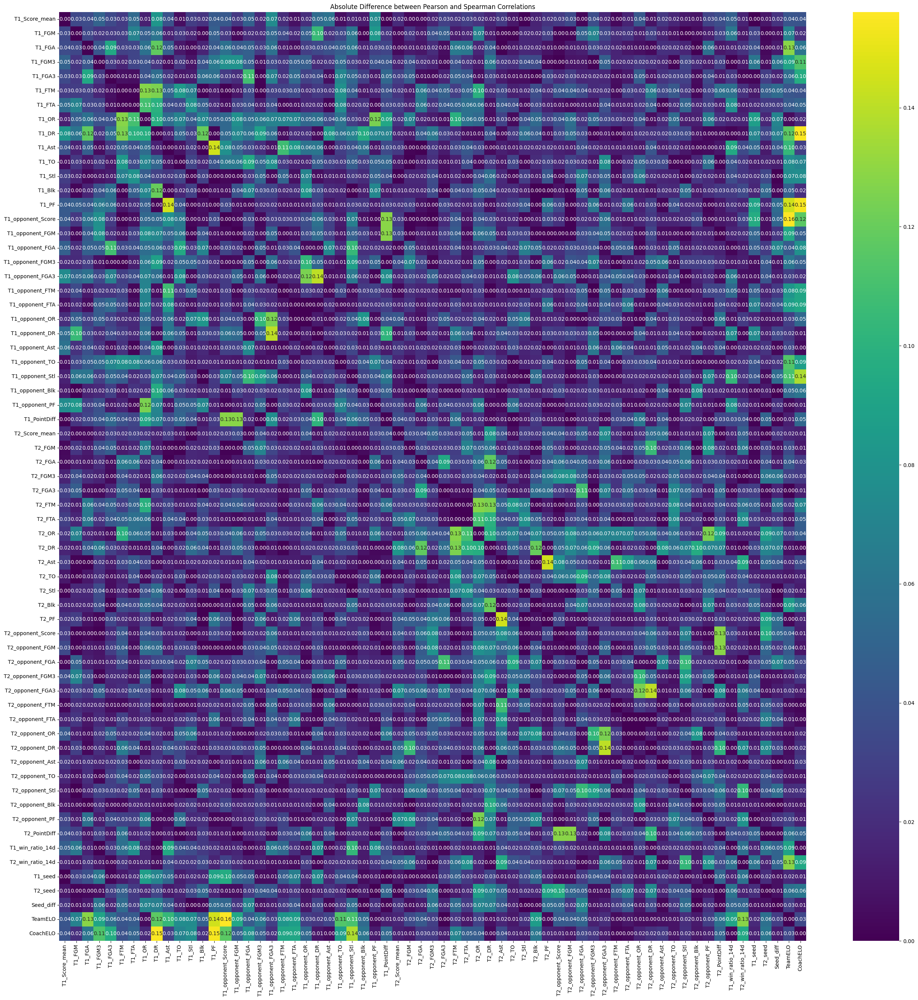

In [73]:
plt.figure(figsize=(32,32))
sns.heatmap(diff_matrix, annot=True, cmap='viridis', fmt=".2f")
plt.title("Absolute Difference between Pearson and Spearman Correlations")
plt.show()

In [74]:
significant_cols = diff_matrix.columns[(diff_matrix >= 0.14).any()]
diff_matrix_significant = diff_matrix.loc[significant_cols, significant_cols]
diff_matrix_significant

,T1_DR,T1_Ast,T1_PF,T1_opponent_Score,T1_opponent_FGA3,T1_opponent_DR,T2_Ast,T2_PF,T2_opponent_FGA3,T2_opponent_DR,TeamELO,CoachELO
T1_DR,1.110223e-16,1.458740e-02,0.001701,0.052177,5.546255e-02,4.300877e-03,0.004102,5.856565e-03,7.969330e-03,0.022543,1.169887e-01,0.154921
T1_Ast,1.458740e-02,1.110223e-16,0.144802,0.077812,7.507879e-03,6.119039e-02,0.013586,1.985585e-02,1.315123e-02,0.041534,1.039365e-01,0.028696
T1_PF,1.701317e-03,1.448024e-01,0.000000,0.032692,2.181016e-02,2.967916e-02,0.019856,5.989062e-02,9.769958e-03,0.029078,1.449790e-01,0.153964
T1_opponent_Score,5.217717e-02,7.781158e-02,0.032692,0.000000,2.694990e-02,5.739986e-02,0.014279,3.315936e-02,5.805532e-02,0.025815,1.560541e-01,0.116368
T1_opponent_FGA3,5.546255e-02,7.507879e-03,0.021810,0.026950,2.220446e-16,1.406871e-01,0.013151,9.769958e-03,4.060183e-02,0.000249,2.908021e-02,0.020933
T1_opponent_DR,4.300877e-03,6.119039e-02,0.029679,0.057400,1.406871e-01,2.220446e-16,0.041534,2.907811e-02,2.490838e-04,0.011341,2.483769e-02,0.008940
T2_Ast,4.102233e-03,1.358580e-02,0.019856,0.014279,1.315123e-02,4.153369e-02,0.000000,1.448024e-01,7.507879e-03,0.061190,1.649903e-02,0.035413
T2_PF,5.856565e-03,1.985585e-02,0.059891,0.033159,9.769958e-03,2.907811e-02,0.144802,1.110223e-16,2.181016e-02,0.029679,2.951882e-03,0.014893
T2_opponent_FGA3,7.969330e-03,1.315123e-02,0.009770,0.058055,4.060183e-02,2.490838e-04,0.007508,2.181016e-02,2.220446e-16,0.140687,1.975105e-02,0.011007
T2_opponent_DR,2.254296e-02,4.153369e-02,0.029078,0.025815,2.490838e-04,1.134055e-02,0.061190,2.967916e-02,1.406871e-01,0.000000,4.947673e-03,0.022426


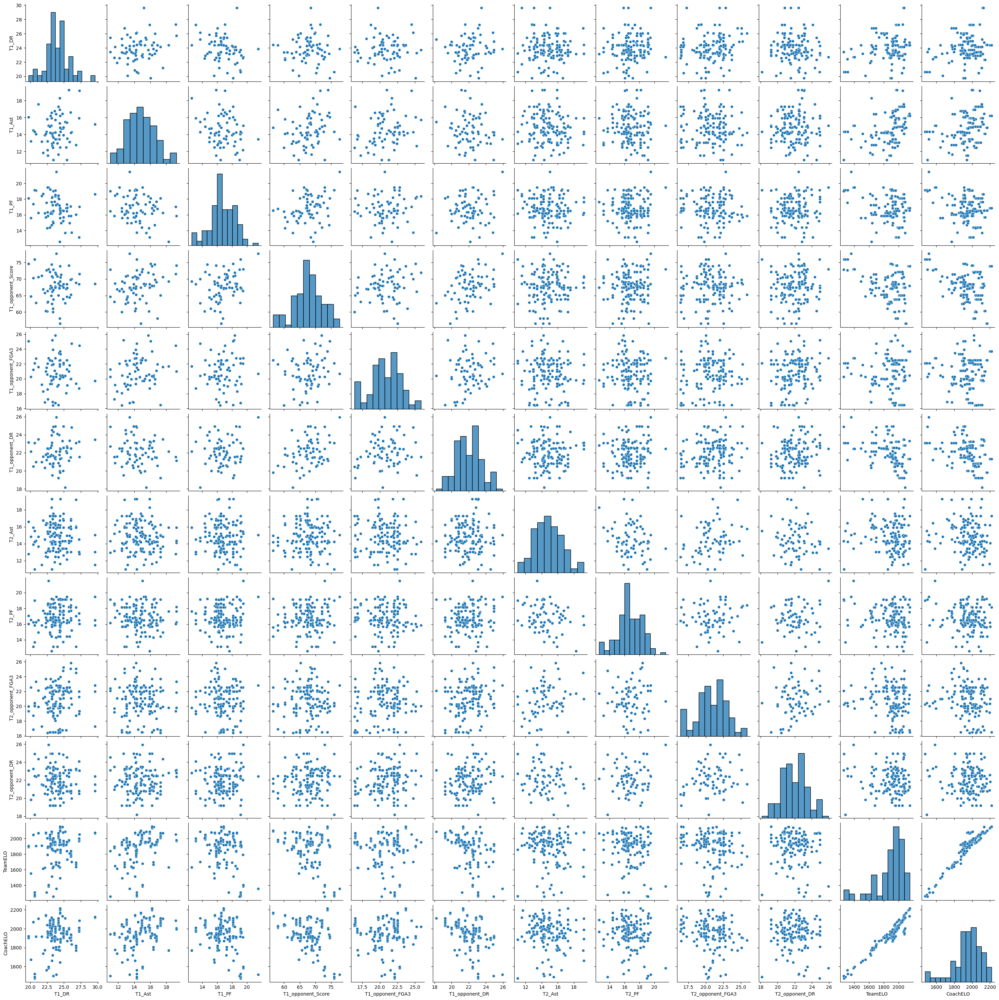

In [75]:
sns.pairplot(df_test_men_list.iloc[:, 7:][list(diff_matrix_significant)])
plt.show()

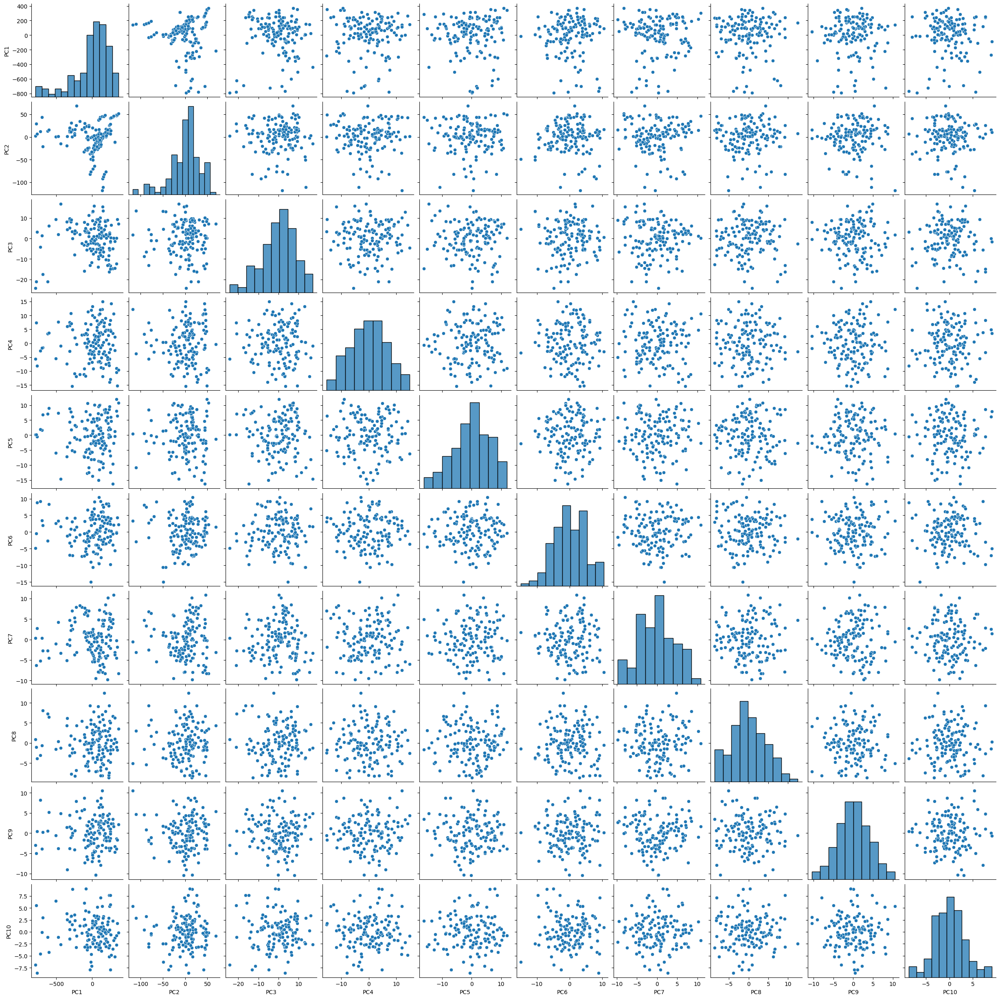

In [76]:
pca = PCA(n_components=10)
df_pca = pd.DataFrame(pca.fit_transform(df_test_men_list.iloc[:, 7:]), columns=[f'PC{i+1}' for i in range(10)])
sns.pairplot(df_pca)
plt.show()

In [77]:
print('No PCA')
pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('clf', LogisticRegressionCV(
                cv=5,
                solver='lbfgs',
                max_iter=2000,
                scoring='neg_log_loss',
                refit=True
            ))
    ])
pipeline.fit(x_train_men, y_train_men)
y_prob_men = pipeline.predict_proba(x_test_men)[:, 1]
score = brier_score_loss(y_test_men, y_prob_men)
print(score)

component_number = 10
print('PCA, ', component_number, ' components')
pca = PCA(n_components=component_number)
df_pca_train = pd.DataFrame(pca.fit_transform(df_train_men_list.iloc[:, 7:]), columns=[f'PC{i+1}' for i in range(component_number)])
pca = PCA(n_components=component_number)
df_pca_test = pd.DataFrame(pca.fit_transform(df_test_men_list.iloc[:, 7:]), columns=[f'PC{i+1}' for i in range(component_number)])

pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('clf', LogisticRegressionCV(
                cv=5,
                solver='lbfgs',
                max_iter=2000,
                scoring='neg_log_loss',
                refit=True
            ))
    ])
pipeline.fit(df_pca_train, y_train_men)
y_prob_men = pipeline.predict_proba(df_pca_test)[:, 1]
score = brier_score_loss(y_test_men, y_prob_men)
print(score)

No PCA
0.20299635038791838
PCA,  10  components
0.2240772975444474


### For women

In [78]:
# Example usage:
# Suppose you want to compute the nonlinearity matrix for the columns from index 7 onward:
diff_matrix = nonlinearity_matrix(df_test_women_list.iloc[:, 7:])

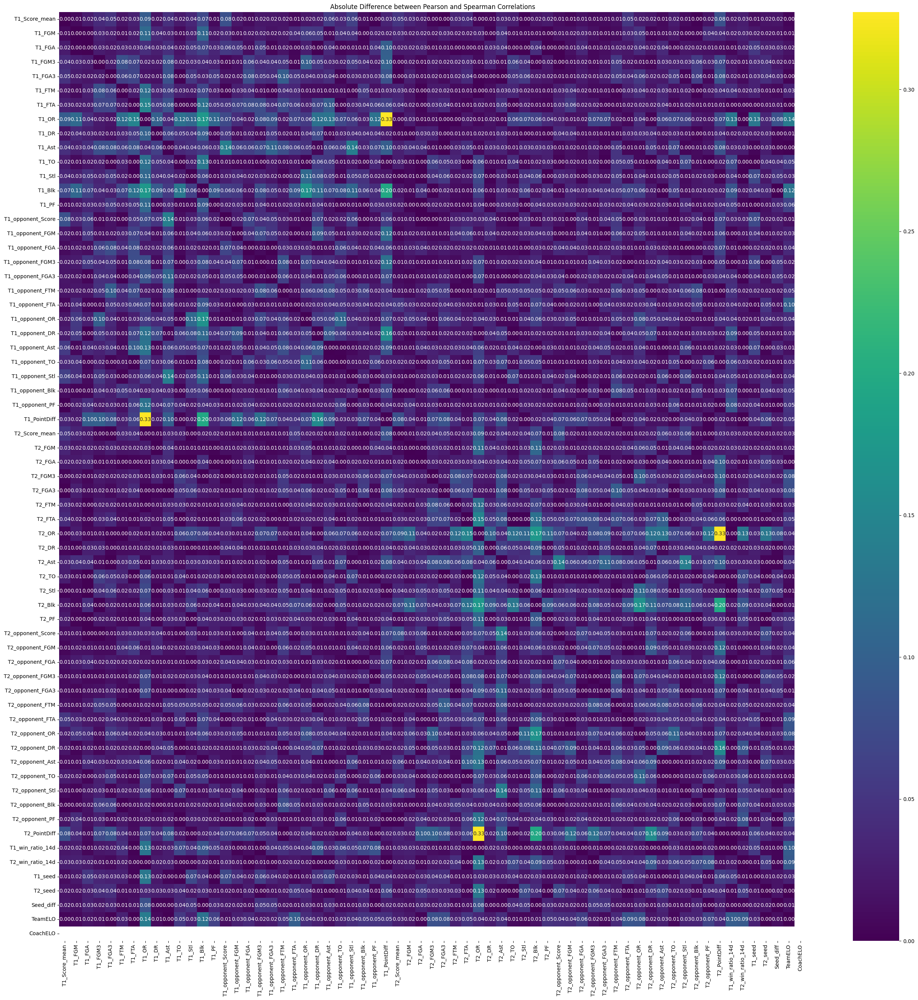

In [79]:
plt.figure(figsize=(32,32))
sns.heatmap(diff_matrix, annot=True, cmap='viridis', fmt=".2f")
plt.title("Absolute Difference between Pearson and Spearman Correlations")
plt.show()

In [80]:
significant_cols = diff_matrix.columns[(diff_matrix >= 0.14).any()]
diff_matrix_significant = diff_matrix.loc[significant_cols, significant_cols]
diff_matrix_significant

,T1_FTA,T1_OR,T1_Blk,T1_opponent_OR,T1_opponent_DR,T1_PointDiff,T2_FTA,T2_OR,T2_Blk,T2_opponent_OR,T2_opponent_DR,T2_PointDiff
T1_FTA,2.220446e-16,0.147163,1.226000e-01,0.027596,0.066137,0.063071,0.005957,0.020138,0.008901,0.021975,0.018595,0.012724
T1_OR,1.471634e-01,0.000000,1.748407e-01,0.055621,0.121805,0.327232,0.020138,0.006613,0.062009,0.039671,0.002788,0.073851
T1_Blk,1.226000e-01,0.174841,3.330669e-16,0.165622,0.111104,0.195747,0.008901,0.062009,0.015929,0.062152,0.022057,0.023165
T1_opponent_OR,2.759615e-02,0.055621,1.656219e-01,0.000000,0.054015,0.070475,0.021975,0.039671,0.062152,0.078450,0.045966,0.042578
T1_opponent_DR,6.613708e-02,0.121805,1.111044e-01,0.054015,0.000000,0.156701,0.018595,0.002788,0.022057,0.045966,0.068814,0.015150
T1_PointDiff,6.307054e-02,0.327232,1.957472e-01,0.070475,0.156701,0.000000,0.012724,0.073851,0.023165,0.042578,0.015150,0.024691
T2_FTA,5.956746e-03,0.020138,8.900796e-03,0.021975,0.018595,0.012724,0.000000,0.147163,0.122600,0.027596,0.066137,0.063071
T2_OR,2.013826e-02,0.006613,6.200939e-02,0.039671,0.002788,0.073851,0.147163,0.000000,0.174841,0.055621,0.121805,0.327232
T2_Blk,8.900796e-03,0.062009,1.592939e-02,0.062152,0.022057,0.023165,0.122600,0.174841,0.000000,0.165622,0.111104,0.195747
T2_opponent_OR,2.197471e-02,0.039671,6.215163e-02,0.078450,0.045966,0.042578,0.027596,0.055621,0.165622,0.000000,0.054015,0.070475


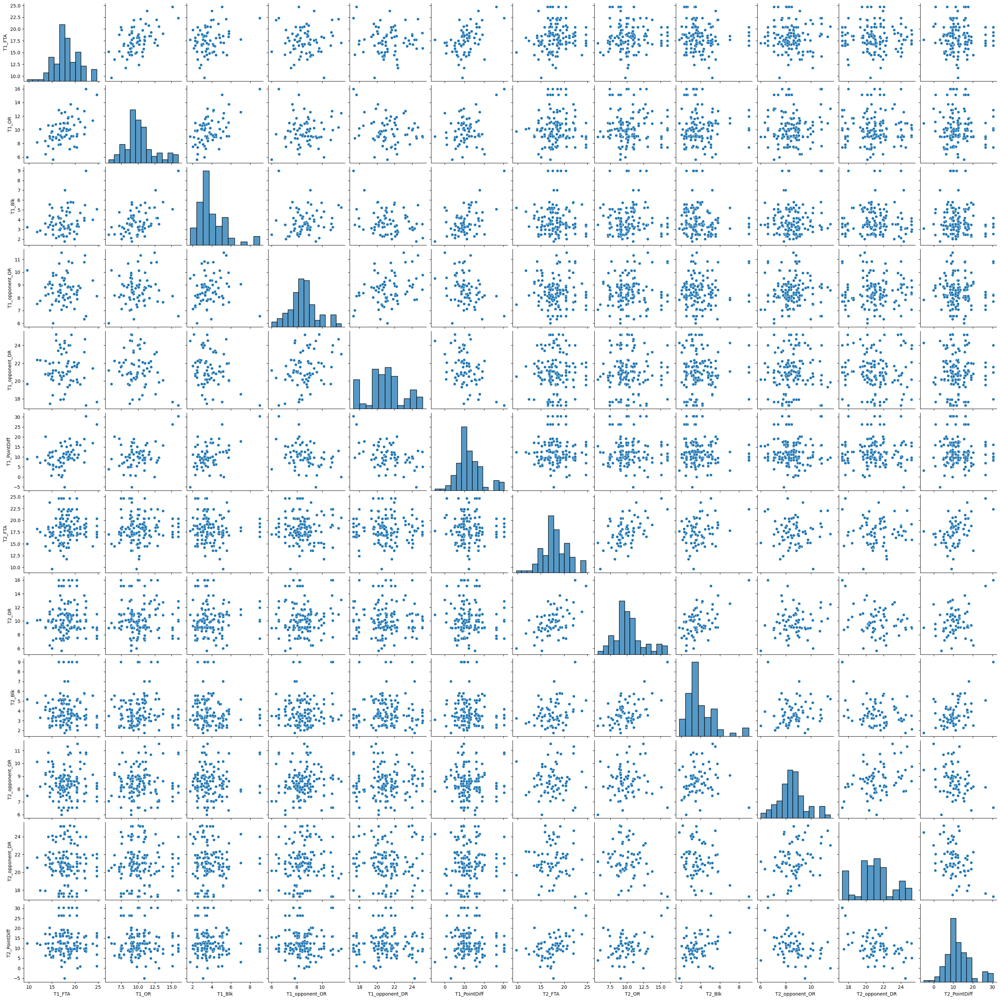

In [81]:
sns.pairplot(df_test_women_list.iloc[:, 7:][list(diff_matrix_significant)])
plt.show()

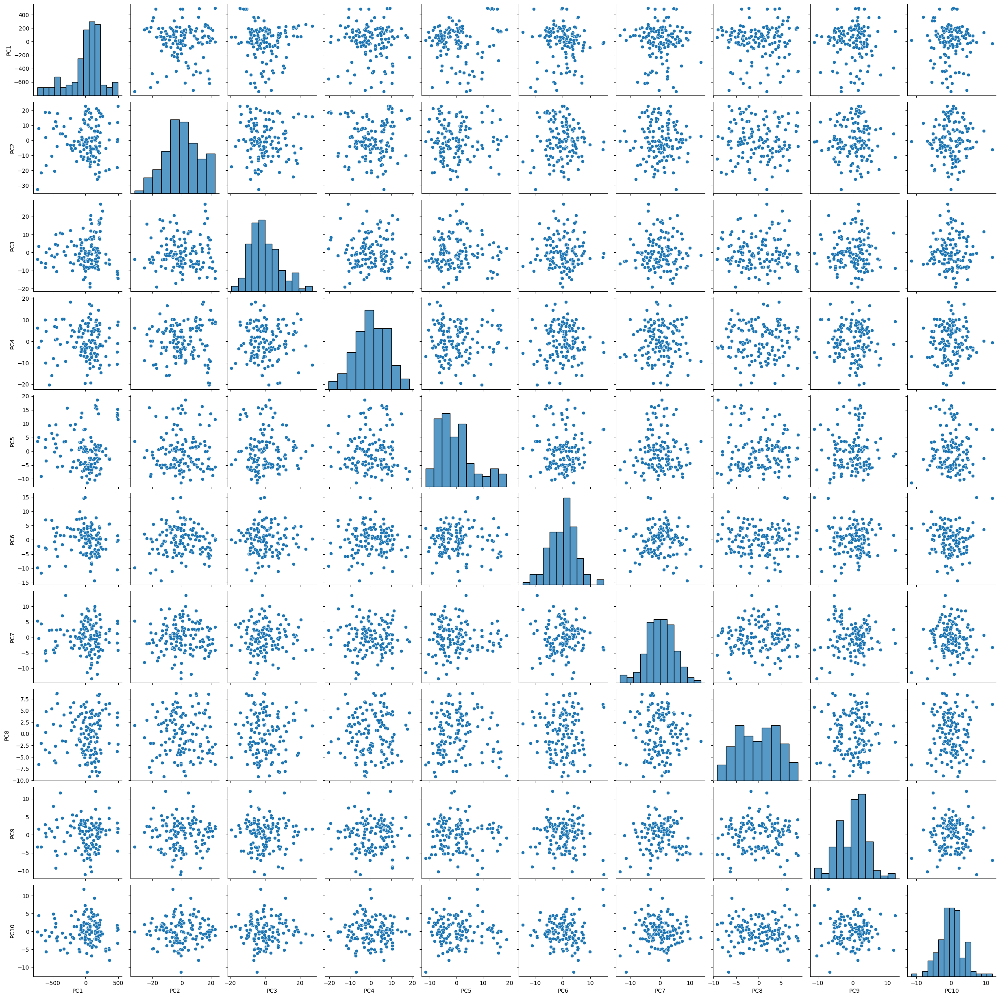

In [82]:
pca = PCA(n_components=10)
df_pca = pd.DataFrame(pca.fit_transform(df_test_women_list.iloc[:, 7:]), columns=[f'PC{i+1}' for i in range(10)])
sns.pairplot(df_pca)
plt.show()

In [83]:
print('No PCA')
pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('clf', LogisticRegressionCV(
                cv=5,
                solver='lbfgs',
                max_iter=2000,
                scoring='neg_log_loss',
                refit=True
            ))
    ])
pipeline.fit(x_train_women, y_train_women)
y_prob_women = pipeline.predict_proba(x_test_women)[:, 1]
score = brier_score_loss(y_test_women, y_prob_women)
print(score)

component_number = 10
print('PCA, ', component_number, ' components')
pca = PCA(n_components=component_number)
df_pca_train = pd.DataFrame(pca.fit_transform(df_train_women_list.iloc[:, 7:]), columns=[f'PC{i+1}' for i in range(component_number)])
pca = PCA(n_components=component_number)
df_pca_test = pd.DataFrame(pca.fit_transform(df_test_women_list.iloc[:, 7:]), columns=[f'PC{i+1}' for i in range(component_number)])

pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('clf', LogisticRegressionCV(
                cv=5,
                solver='lbfgs',
                max_iter=2000,
                scoring='neg_log_loss',
                refit=True
            ))
    ])
pipeline.fit(df_pca_train, y_train_women)
y_prob_women = pipeline.predict_proba(df_pca_test)[:, 1]
score = brier_score_loss(y_test_women, y_prob_women)
print(score)

No PCA
0.1757032823447459
PCA,  10  components
0.1874051629954101


### Trying transformations

In [84]:
from sklearn.preprocessing import PowerTransformer
def auto_power_transform(X, y, threshold=0.1):
    """
    Automatically detects non-linear features by comparing Pearson and Spearman correlations 
    with the target y. If the absolute difference is above threshold, transforms that feature 
    using PowerTransformer (Yeo-Johnson). Returns a new DataFrame with transformed features.
    
    Parameters:
      X : pd.DataFrame
          DataFrame of numeric features.
      y : array-like
          Target vector (numeric or binary).
      threshold : float (default=0.1)
          Minimum absolute difference between Pearson and Spearman correlations
          to trigger a transformation.
    
    Returns:
      X_transformed : pd.DataFrame
          DataFrame with selected features transformed.
    """
    # Make a copy so as not to modify original data
    X_transformed = X.copy()
    
    # Loop over each feature column
    for col in X.columns:
        # Create a temporary DataFrame with feature and target; drop NaNs.
        temp = pd.DataFrame({col: X[col], 'target': y}).dropna()
        if temp.empty:
            continue
        # Compute correlations
        p_corr, _ = pearsonr(temp[col], temp['target'])
        s_corr, _ = spearmanr(temp[col], temp['target'])
        diff = abs(p_corr - s_corr)
        print(f"Column: {col}, Pearson: {p_corr:.3f}, Spearman: {s_corr:.3f}, Diff: {diff:.3f}")
        # If the difference is larger than the threshold, apply PowerTransformer.
        if diff > threshold:
            pt = PowerTransformer(method='yeo-johnson', standardize=True)
            # Reshape the column to 2D for transformation and flatten back
            col_vals = X_transformed[col].values.reshape(-1, 1)
            X_transformed[col] = pt.fit_transform(col_vals).flatten()
            print(f"Transformed column {col}")
    return X_transformed


In [85]:

# Example usage:
# Suppose X is your DataFrame of features and y is your target vector.
X_transformed = auto_power_transform(df_test_women_list, y_test_women, threshold=0.14)

Column: Season, Pearson: nan, Spearman: nan, Diff: nan
Column: DayNum, Pearson: 0.000, Spearman: 0.000, Diff: 0.000
Column: T1_TeamID, Pearson: 0.065, Spearman: 0.060, Diff: 0.006
Column: T1_Score, Pearson: 0.577, Spearman: 0.582, Diff: 0.005
Column: T2_TeamID, Pearson: -0.065, Spearman: -0.060, Diff: 0.006
Column: T2_Score, Pearson: -0.577, Spearman: -0.582, Diff: 0.005
Column: location, Pearson: 0.545, Spearman: 0.545, Diff: 0.000
Column: T1_Score_mean, Pearson: 0.344, Spearman: 0.321, Diff: 0.023
Column: T1_FGM, Pearson: 0.374, Spearman: 0.361, Diff: 0.013
Column: T1_FGA, Pearson: 0.290, Spearman: 0.275, Diff: 0.015
Column: T1_FGM3, Pearson: -0.039, Spearman: -0.055, Diff: 0.016
Column: T1_FGA3, Pearson: -0.095, Spearman: -0.102, Diff: 0.006
Column: T1_FTM, Pearson: 0.285, Spearman: 0.261, Diff: 0.024
Column: T1_FTA, Pearson: 0.279, Spearman: 0.249, Diff: 0.030
Column: T1_OR, Pearson: 0.214, Spearman: 0.175, Diff: 0.039
Column: T1_DR, Pearson: 0.194, Spearman: 0.193, Diff: 0.001
Col

In [86]:
diff_matrix = nonlinearity_matrix(X_transformed.iloc[:, 7:])

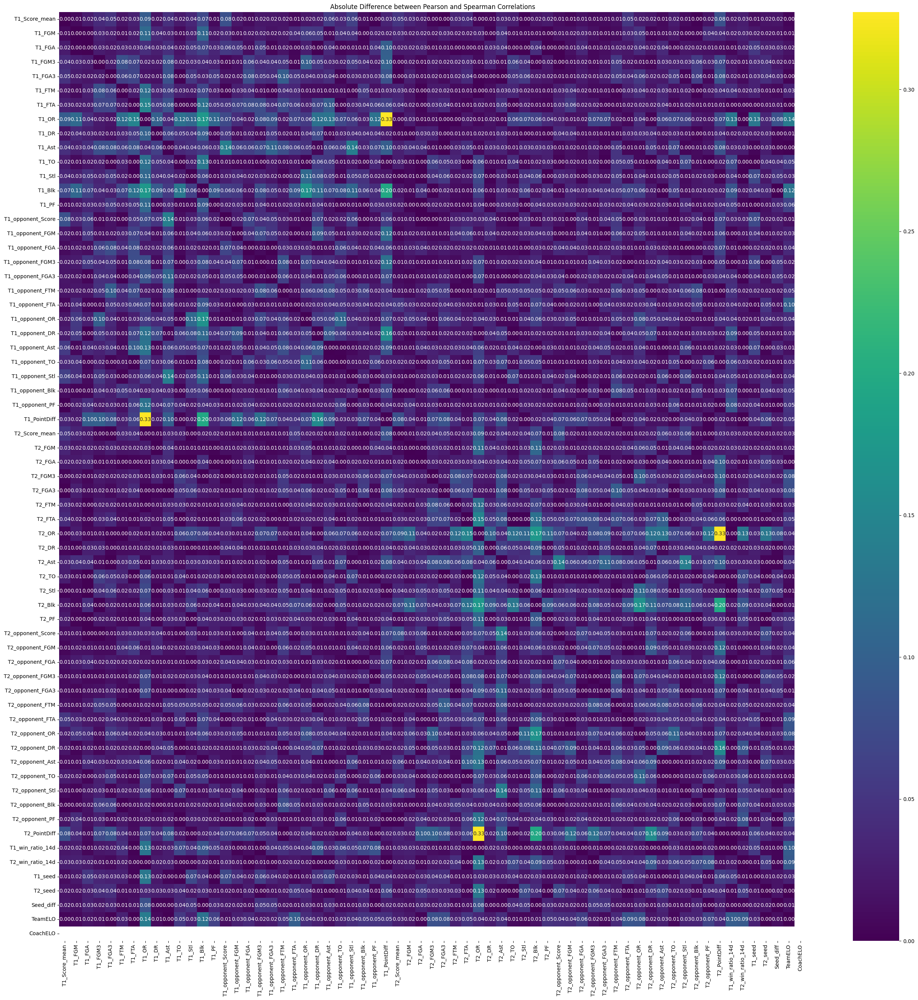

In [87]:
plt.figure(figsize=(32,32))
sns.heatmap(diff_matrix, annot=True, cmap='viridis', fmt=".2f")
plt.title("Absolute Difference between Pearson and Spearman Correlations")
plt.show()

In [88]:
X_train_transformed = auto_power_transform(df_train_women_list, y_train_women, threshold=0.14)

Column: Season, Pearson: -0.000, Spearman: 0.000, Diff: 0.000
Column: DayNum, Pearson: 0.000, Spearman: 0.000, Diff: 0.000
Column: T1_TeamID, Pearson: -0.008, Spearman: -0.010, Diff: 0.003
Column: T1_Score, Pearson: 0.589, Spearman: 0.608, Diff: 0.019
Column: T2_TeamID, Pearson: 0.008, Spearman: 0.010, Diff: 0.003
Column: T2_Score, Pearson: -0.589, Spearman: -0.608, Diff: 0.019
Column: location, Pearson: 0.417, Spearman: 0.417, Diff: 0.000
Column: T1_Score_mean, Pearson: 0.303, Spearman: 0.302, Diff: 0.001
Column: T1_FGM, Pearson: 0.337, Spearman: 0.338, Diff: 0.000
Column: T1_FGA, Pearson: 0.179, Spearman: 0.184, Diff: 0.005
Column: T1_FGM3, Pearson: -0.051, Spearman: -0.053, Diff: 0.003
Column: T1_FGA3, Pearson: -0.112, Spearman: -0.113, Diff: 0.001
Column: T1_FTM, Pearson: 0.088, Spearman: 0.089, Diff: 0.001
Column: T1_FTA, Pearson: 0.065, Spearman: 0.071, Diff: 0.006
Column: T1_OR, Pearson: 0.106, Spearman: 0.106, Diff: 0.001
Column: T1_DR, Pearson: 0.181, Spearman: 0.182, Diff: 0.

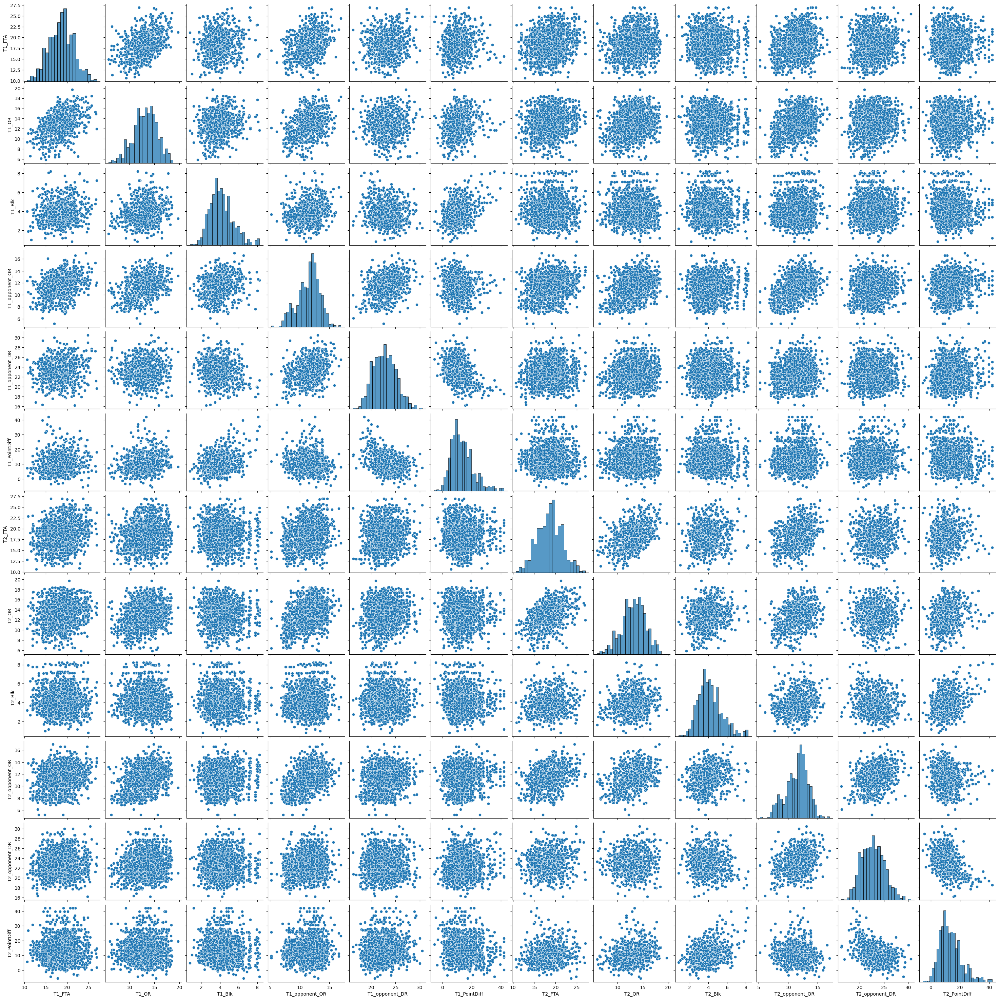

In [89]:
sns.pairplot(X_train_transformed.iloc[:, 7:][list(diff_matrix_significant)])
plt.show()

In [90]:
print('No PCA')
pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('clf', LogisticRegressionCV(
                cv=5,
                solver='lbfgs',
                max_iter=2000,
                scoring='neg_log_loss',
                refit=True
            ))
    ])
pipeline.fit(X_train_transformed, y_train_women)
y_prob_women = pipeline.predict_proba(X_transformed)[:, 1]
score = brier_score_loss(y_test_women, y_prob_women)
print(score)

No PCA
0.011406949034773007


In [91]:
y_prob_women

array([1.00000000e+00, 9.99999929e-01, 9.91959741e-01, 9.99999341e-01,
       1.00000000e+00, 1.00000000e+00, 1.00000000e+00, 1.00000000e+00,
       1.00000000e+00, 1.00000000e+00, 1.00000000e+00, 1.00000000e+00,
       1.00000000e+00, 4.94365714e-01, 9.93906440e-01, 1.00000000e+00,
       9.87466539e-01, 1.00000000e+00, 1.00000000e+00, 1.00000000e+00,
       9.98495695e-01, 1.00000000e+00, 1.00000000e+00, 1.00000000e+00,
       9.99999976e-01, 1.00000000e+00, 9.99106159e-01, 9.94534860e-01,
       4.65295307e-01, 1.00000000e+00, 1.00000000e+00, 1.00000000e+00,
       1.00000000e+00, 9.99984864e-01, 1.00000000e+00, 1.00000000e+00,
       9.99982369e-01, 1.00000000e+00, 9.99999999e-01, 9.99986751e-01,
       9.99934256e-01, 1.00000000e+00, 9.99999566e-01, 1.00000000e+00,
       9.99945674e-01, 1.00000000e+00, 1.00000000e+00, 9.85965731e-01,
       9.95988654e-01, 1.00000000e+00, 9.99999981e-01, 1.00000000e+00,
       9.99999828e-01, 9.99998849e-01, 9.86633455e-01, 9.99481668e-01,
      

In [92]:
y_test_women

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [93]:
X_transformed

,Season,DayNum,T1_TeamID,T1_Score,T2_TeamID,T2_Score,location,T1_Score_mean,T1_FGM,T1_FGA,T1_FGM3,T1_FGA3,T1_FTM,T1_FTA,T1_OR,T1_DR,T1_Ast,T1_TO,T1_Stl,T1_Blk,T1_PF,T1_opponent_Score,T1_opponent_FGM,T1_opponent_FGA,T1_opponent_FGM3,T1_opponent_FGA3,T1_opponent_FTM,T1_opponent_FTA,T1_opponent_OR,T1_opponent_DR,T1_opponent_Ast,T1_opponent_TO,T1_opponent_Stl,T1_opponent_Blk,T1_opponent_PF,T1_PointDiff,T2_Score_mean,T2_FGM,T2_FGA,T2_FGM3,T2_FGA3,T2_FTM,T2_FTA,T2_OR,T2_DR,T2_Ast,T2_TO,T2_Stl,T2_Blk,T2_PF,T2_opponent_Score,T2_opponent_FGM,T2_opponent_FGA,T2_opponent_FGM3,T2_opponent_FGA3,T2_opponent_FTM,T2_opponent_FTA,T2_opponent_OR,T2_opponent_DR,T2_opponent_Ast,T2_opponent_TO,T2_opponent_Stl,T2_opponent_Blk,T2_opponent_PF,T2_PointDiff,T1_win_ratio_14d,T2_win_ratio_14d,T1_seed,T2_seed,Seed_diff,TeamELO,CoachELO
0,2023,135,3280,70,3228,56,0,71.533333,26.833333,59.600000,5.833333,16.466667,12.033333,18.166667,10.100000,26.366667,15.866667,15.600000,9.133333,4.833333,15.733333,59.100000,21.533333,60.033333,6.000000,22.000000,10.033333,15.300000,10.133333,21.666667,12.366667,16.400000,7.566667,3.433333,17.966667,12.433333,75.935484,28.967742,62.967742,7.258065,19.225806,10.741935,14.193548,10.677419,24.193548,14.322581,12.516129,6.096774,3.258065,16.612903,65.064516,23.580645,58.677419,4.935484,17.967742,12.967742,17.935484,8.290323,20.838710,11.967742,13.387097,6.322581,2.838710,15.451613,10.870968,0.000000,0.500000,11,11,0,1904.755175,1612.000528
1,2023,135,3357,57,3380,47,0,62.300000,22.766667,59.866667,5.233333,19.366667,11.533333,17.733333,10.933333,22.233333,10.300000,15.233333,9.633333,3.100000,18.600000,59.133333,20.933333,53.833333,5.800000,18.366667,11.466667,17.366667,7.833333,24.300000,12.133333,18.100000,6.400000,3.033333,17.633333,3.166667,56.333333,20.766667,56.033333,4.866667,14.566667,9.933333,17.700000,9.033333,19.900000,9.933333,13.466667,8.300000,1.766667,20.900000,61.433333,20.966667,50.500000,5.000000,17.200000,14.500000,23.100000,9.500000,24.500000,11.900000,17.366667,6.033333,3.900000,16.766667,-5.100000,1.000000,0.833333,16,16,0,1267.963868,1612.000528
2,2023,136,3385,66,3345,64,0,65.466667,23.833333,54.433333,6.166667,17.333333,11.633333,15.233333,8.966667,22.266667,12.866667,12.900000,5.233333,4.233333,12.433333,59.366667,22.966667,57.933333,4.900000,17.000000,8.533333,12.266667,9.933333,20.100000,11.566667,12.000000,7.033333,3.266667,16.033333,6.100000,70.689655,25.896552,57.724138,7.137931,21.896552,11.758621,15.241379,7.206897,24.482759,15.931034,14.620690,7.793103,3.379310,16.275862,65.172414,23.413793,59.896552,6.965517,22.379310,11.379310,16.275862,9.724138,22.068966,12.965517,15.172414,7.103448,2.827586,16.793103,5.517241,0.500000,0.500000,11,11,0,1803.623948,1612.000528
3,2023,136,3399,79,3284,69,0,68.551724,24.689655,57.517241,6.206897,19.206897,12.965517,17.068966,9.827586,20.620690,15.310345,12.724138,7.896552,2.448276,17.931034,63.137931,22.482759,54.241379,3.827586,14.896552,14.344828,19.517241,8.965517,20.379310,12.137931,15.344828,6.379310,2.551724,18.689655,5.413793,63.656250,22.750000,55.281250,7.687500,23.187500,10.468750,14.843750,9.593750,23.468750,13.250000,16.687500,6.062500,3.750000,14.562500,62.937500,24.281250,59.156250,4.750000,14.843750,9.625000,14.125000,8.750000,20.218750,11.031250,12.500000,8.093750,2.875000,15.875000,0.718750,1.000000,0.833333,16,16,0,1532.928726,1612.000528
4,2023,137,3112,75,3452,62,0,74.366667,27.900000,63.866667,5.633333,16.566667,12.933333,18.866667,10.066667,22.233333,14.633333,12.133333,10.766667,3.000000,18.800000,64.800000,23.433333,56.866667,5.366667,17.633333,12.566667,18.000000,8.833333,24.000000,13.666667,17.633333,5.933333,3.666667,16.800000,9.566667,66.100000,24.133333,61.533333,6.566667,23.166667,11.266667,15.900000,8.933333,22.200000,11.166667,13.066667,9.633333,2.133333,16.866667,61.000000,22.500000,56.733333,5.500000,20.033333,10.500000,15.433333,9.766667,25.233333,11.333333,18.900000,6.566667,3.533333,17.366667,5.100000,0.000000,0.666667,7,1

In [94]:
y_train_women

array([1., 1., 1., ..., 0., 0., 0.], shape=(1520,))

In [95]:
X_train_transformed

,Season,DayNum,T1_TeamID,T1_Score,T2_TeamID,T2_Score,location,T1_Score_mean,T1_FGM,T1_FGA,T1_FGM3,T1_FGA3,T1_FTM,T1_FTA,T1_OR,T1_DR,T1_Ast,T1_TO,T1_Stl,T1_Blk,T1_PF,T1_opponent_Score,T1_opponent_FGM,T1_opponent_FGA,T1_opponent_FGM3,T1_opponent_FGA3,T1_opponent_FTM,T1_opponent_FTA,T1_opponent_OR,T1_opponent_DR,T1_opponent_Ast,T1_opponent_TO,T1_opponent_Stl,T1_opponent_Blk,T1_opponent_PF,T1_PointDiff,T2_Score_mean,T2_FGM,T2_FGA,T2_FGM3,T2_FGA3,T2_FTM,T2_FTA,T2_OR,T2_DR,T2_Ast,T2_TO,T2_Stl,T2_Blk,T2_PF,T2_opponent_Score,T2_opponent_FGM,T2_opponent_FGA,T2_opponent_FGM3,T2_opponent_FGA3,T2_opponent_FTM,T2_opponent_FTA,T2_opponent_OR,T2_opponent_DR,T2_opponent_Ast,T2_opponent_TO,T2_opponent_Stl,T2_opponent_Blk,T2_opponent_PF,T2_PointDiff,T1_win_ratio_14d,T2_win_ratio_14d,T1_seed,T2_seed,Seed_diff,TeamELO,CoachELO
0,2010,138,3124,69,3201,55,0,72.093750,26.093750,56.343750,2.468750,8.656250,17.437500,24.000000,12.187500,31.062500,14.687500,16.875000,6.968750,7.250000,14.125000,56.843750,21.125000,62.625000,5.531250,19.937500,9.062500,13.187500,12.687500,21.781250,9.500000,15.718750,6.656250,1.875000,19.250000,15.250000,73.454545,25.848485,61.575758,8.818182,24.848485,12.939394,18.242424,13.878788,24.575758,14.636364,15.636364,10.393939,2.606061,16.393939,60.575758,22.939394,56.696970,4.151515,13.848485,10.545455,16.303030,12.242424,24.818182,11.848485,19.878788,6.757576,2.606061,16.242424,12.878788,0.5,0.750000,4,13,-9,2047.364734,1612.000528
1,2010,138,3173,67,3395,66,0,70.769231,25.884615,61.538462,5.461538,17.461538,13.538462,19.346154,14.730769,28.076923,14.461538,16.961538,7.730769,4.076923,16.576923,59.500000,21.576923,58.692308,5.423077,16.846154,10.923077,16.576923,12.076923,23.769231,11.653846,18.346154,7.615385,4.384615,18.230769,11.269231,72.300000,25.833333,62.266667,6.866667,19.200000,13.766667,18.400000,13.500000,25.833333,15.600000,16.033333,9.833333,3.600000,16.233333,60.300000,21.833333,59.700000,5.733333,20.166667,10.900000,16.300000,14.866667,25.333333,13.466667,20.666667,8.466667,3.500000,16.566667,12.000000,0.5,0.333333,8,9,-1,1803.100984,1612.000528
2,2010,138,3181,72,3214,37,1,71.593750,26.843750,63.750000,4.562500,14.468750,13.343750,20.156250,17.718750,25.593750,14.250000,17.906250,13.375000,5.281250,17.687500,55.062500,18.843750,53.593750,5.312500,16.593750,12.062500,18.125000,12.500000,21.968750,11.375000,23.218750,7.531250,3.281250,17.875000,16.531250,62.833333,22.200000,60.100000,4.900000,16.100000,13.533333,18.933333,14.966667,22.666667,11.600000,15.533333,10.100000,2.233333,18.833333,55.133333,19.000000,49.933333,2.866667,10.333333,14.266667,22.000000,12.633333,26.133333,8.733333,22.133333,6.633333,2.266667,16.700000,7.700000,1.0,1.000000,2,15,-13,2222.732883,1612.000528
3,2010,138,3199,75,3256,61,1,74.466667,26.400000,59.200000,6.100000,16.100000,15.566667,21.800000,14.400000,27.266667,15.333333,19.033333,8.833333,4.033333,17.133333,60.100000,21.333333,59.566667,5.300000,18.433333,12.133333,17.466667,13.400000,21.166667,12.233333,19.200000,8.200000,2.133333,18.933333,14.366667,74.258065,27.161290,62.516129,3.935484,12.451613,16.000000,23.354839,14.806452,29.741935,14.516129,17.096774,7.096774,3.741935,16.032258,64.322581,23.903226,64.064516,4.806452,17.387097,11.709677,18.000000,13.709677,24.451613,10.741935,17.451613,8.193548,4.225806,19.677419,9.935484,0.0,0.800000,3,14,-11,2065.191353,1612.000528
4,2010,138,3207,62,3265,42,0,68.033333,23.833333,60.266667,6.333333,20.066667,14.033333,19.533333,15.766667,19.466667,15.866667,16.300000,13.366667,2.600000,18.033333,58.366667,19.733333,48.866667,5.400000,18.833333,13.500000,18.766667,12.100000,22.900000,13.266667,24.600000,7.933333,3.233333,16.966667,9.666667,68.181818,23.424242,55.696970,6.545455,19.030303,14.787879,18.484848,10.515152,26.303030,14.454545,13.484848,7.878788,4.484848,13.969697,57.909091,20.575758,58.939394,6.333333,21.363636,10.424242,14.909091,14.333333,23.363636,10.727273,15.727273,7.151515,2.303030,16.818182,10.272727,0.5,1.000000,5,12,

### Trying transformations

In [96]:
columns_to_include_women = [
 'Season',
 'DayNum',
 'T1_TeamID',
 'T1_Score',
 'T2_TeamID',
 'T2_Score',
 'location',
                      
#  'T1_Score_mean',
 'T1_FGM',
 'T1_FGA',
 'T1_FGM3',
 'T1_FGA3',
#  'T1_FTM',
#  'T1_FTA',
 'T1_OR',
#  'T1_DR',
 'T1_Ast',
 'T1_TO',
 'T1_Stl',
#  'T1_Blk',
 'T1_PF',
                      
#  'T1_opponent_Score',
 'T1_opponent_FGM',
 'T1_opponent_FGA',
 'T1_opponent_FGM3',
 'T1_opponent_FGA3',
#  'T1_opponent_FTM',
#  'T1_opponent_FTA',
 'T1_opponent_OR',
#  'T1_opponent_DR',
 'T1_opponent_Ast',
 'T1_opponent_TO',
 'T1_opponent_Stl',
#  'T1_opponent_Blk',
 'T1_opponent_PF',
 'T1_PointDiff',
                      
#  'T2_Score_mean',
 'T2_FGM',
 'T2_FGA',
 'T2_FGM3',
 'T2_FGA3',
#  'T2_FTM',
#  'T2_FTA',
 'T2_OR',
#  'T2_DR',
 'T2_Ast',
 'T2_TO',
 'T2_Stl',
#  'T2_Blk',
 'T2_PF',
                      
#  'T2_opponent_Score',
 'T2_opponent_FGM',
 'T2_opponent_FGA',
 'T2_opponent_FGM3',
 'T2_opponent_FGA3',
#  'T2_opponent_FTM',
#  'T2_opponent_FTA',
 'T2_opponent_OR',
#  'T2_opponent_DR',
 'T2_opponent_Ast',
 'T2_opponent_TO',
 'T2_opponent_Stl',
#  'T2_opponent_Blk',
 'T2_opponent_PF',
 'T2_PointDiff',
                      
 'T1_win_ratio_14d',
 'T2_win_ratio_14d',
 'T1_seed',
 'T2_seed',
 'Seed_diff',
 'TeamELO',
#  'CoachELO'
]
columns_to_include_men = [
 'Season',
 'DayNum',
 'T1_TeamID',
 'T1_Score',
 'T2_TeamID',
 'T2_Score',
 'location',
                      
#  'T1_Score_mean',
 'T1_FGM',
 'T1_FGA',
 'T1_FGM3',
 'T1_FGA3',
#  'T1_FTM',
#  'T1_FTA',
 'T1_OR',
#  'T1_DR',
 'T1_Ast',
 'T1_TO',
 'T1_Stl',
#  'T1_Blk',
 'T1_PF',
                      
#  'T1_opponent_Score',
 'T1_opponent_FGM',
 'T1_opponent_FGA',
 'T1_opponent_FGM3',
 'T1_opponent_FGA3',
#  'T1_opponent_FTM',
#  'T1_opponent_FTA',
 'T1_opponent_OR',
#  'T1_opponent_DR',
 'T1_opponent_Ast',
 'T1_opponent_TO',
 'T1_opponent_Stl',
#  'T1_opponent_Blk',
 'T1_opponent_PF',
 'T1_PointDiff',
                      
#  'T2_Score_mean',
 'T2_FGM',
 'T2_FGA',
 'T2_FGM3',
 'T2_FGA3',
#  'T2_FTM',
#  'T2_FTA',
 'T2_OR',
#  'T2_DR',
 'T2_Ast',
 'T2_TO',
 'T2_Stl',
#  'T2_Blk',
 'T2_PF',
                      
#  'T2_opponent_Score',
 'T2_opponent_FGM',
 'T2_opponent_FGA',
 'T2_opponent_FGM3',
 'T2_opponent_FGA3',
#  'T2_opponent_FTM',
#  'T2_opponent_FTA',
 'T2_opponent_OR',
#  'T2_opponent_DR',
 'T2_opponent_Ast',
 'T2_opponent_TO',
 'T2_opponent_Stl',
#  'T2_opponent_Blk',
 'T2_opponent_PF',
 'T2_PointDiff',
                      
 'T1_win_ratio_14d',
 'T2_win_ratio_14d',
 'T1_seed',
 'T2_seed',
 'Seed_diff',
 'TeamELO',
 'CoachELO'
]

year_range = [2023]
start_season = 2003 # from which ponit should we begin creating data
season_years_list  = [[[i] for i in range(start_season, year+1)] for year in year_range] # at which seasons to look at when calculating team's stats
days_back = 150 # how many days back from the start of tourney to calculate team's stats per season
location_multiplier = [0.9, 1.1] # home penalty, away bonus ex.
win_ratio_days_back = 14 # how many days back from the tourney do we calculate win ratio
maximum_favoured_seed = 0
# -------------------------------------------
df_train_women_list, df_test_women_list, df_train_men_list, df_test_men_list = brier_for_all_years(year_range, season_years_list)
x_train_women_list = []
x_test_women_list = []
x_train_men_list = []
x_test_men_list = []
y_train_women_list = []
y_test_women_list = []
y_train_men_list = []
y_test_men_list = []
for i in range(len(year_range)):

    if len(year_range) > 1:
        df_train_women_list[i] = df_train_women_list[i][columns_to_include_women]
        df_test_women_list[i] = df_test_women_list[i][columns_to_include_women]
        df_train_men_list[i] = df_train_men_list[i][columns_to_include_men]
        df_test_men_list[i] = df_test_men_list[i][columns_to_include_men]
        
        x_train_women, y_train_women = x_y_from_data_frame(df_train_women_list[i])
        x_test_women, y_test_women = x_y_from_data_frame(df_test_women_list[i])
        x_train_men, y_train_men = x_y_from_data_frame(df_train_men_list[i])
        x_test_men, y_test_men = x_y_from_data_frame(df_test_men_list[i])

        x_train_women, y_train_women = clear_na_from_x_y(x_train_women.copy(), y_train_women.copy())
        x_test_women, y_test_women = clear_na_from_x_y(x_test_women.copy(), y_test_women.copy())
        x_train_men, y_train_men = clear_na_from_x_y(x_train_men.copy(), y_train_men.copy())
        x_test_men, y_test_men = clear_na_from_x_y(x_test_men.copy(), y_test_men.copy())
        
        x_train_women_list.append(x_train_women)
        x_test_women_list.append(x_test_women)
        x_train_men_list.append(x_train_men)
        x_test_men_list.append(x_test_men)

        y_train_women_list.append(y_train_women)
        y_test_women_list.append(y_test_women)
        y_train_men_list.append(y_train_men)
        y_test_men_list.append(y_test_men)
    
    else:
        df_train_women_list = df_train_women_list[0][columns_to_include_women]
        df_test_women_list = df_test_women_list[0][columns_to_include_women]
        df_train_men_list = df_train_men_list[0][columns_to_include_men]
        df_test_men_list = df_test_men_list[0][columns_to_include_men]

        x_train_women, y_train_women = x_y_from_data_frame(df_train_women_list)
        x_test_women, y_test_women = x_y_from_data_frame(df_test_women_list)
        x_train_men, y_train_men = x_y_from_data_frame(df_train_men_list)
        x_test_men, y_test_men = x_y_from_data_frame(df_test_men_list)

        x_train_women, y_train_women = clear_na_from_x_y(x_train_women.copy(), y_train_women.copy())
        x_test_women, y_test_women = clear_na_from_x_y(x_test_women.copy(), y_test_women.copy())
        x_train_men, y_train_men = clear_na_from_x_y(x_train_men.copy(), y_train_men.copy())
        x_test_men, y_test_men = clear_na_from_x_y(x_test_men.copy(), y_test_men.copy())

In [101]:
for i in range(len(year_range)):
    print("Predictions for season ", year_range[i])
    pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('clf', LogisticRegressionCV(
                cv=5,
                solver='lbfgs',
                max_iter=2000,
                scoring='neg_log_loss',
                refit=True
            ))
    ])
    pipeline.fit(x_train_women, y_train_women)
    y_prob_women = pipeline.predict_proba(x_test_women)[:, 1]
    score = brier_score_loss(y_test_women, y_prob_women)
    print('LogisticRegressionCV for women trained on women', score)
    # ----------------------------------------------
    pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('clf', LogisticRegressionCV(
                cv=5,
                solver='lbfgs',
                max_iter=2000,
                scoring='neg_log_loss',
                refit=True
            ))
    ])
    pipeline.fit(x_train_men, y_train_men)
    y_prob_men = pipeline.predict_proba(x_test_men)[:, 1]
    score = brier_score_loss(y_test_men, y_prob_men)
    print('LogisticRegressionCV for men trained on men', score)
    # ----------------------------------------------
    y_prob = np.concatenate((y_prob_women, y_prob_men))
    y_test = np.concatenate((y_test_women, y_test_men))
    score = brier_score_loss(y_test, y_prob)
    print('LogisticRegressionCV for all trained on women and men separately', score, '<---')
    print()

Predictions for season  2023
LogisticRegressionCV for women trained on women 0.16393939167608254
LogisticRegressionCV for men trained on men 0.21034449979084843
LogisticRegressionCV for all trained on women and men separately 0.18781448353223024 <---



In [102]:
for i in range(len(year_range)):
    print("Predictions for season ", year_range[i])
    pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('clf', LogisticRegressionCV(
                cv=5,
                solver='lbfgs',
                max_iter=2000,
                scoring='neg_log_loss',
                refit=True
            ))
    ])
    pipeline.fit(x_train_women, y_train_women)
    y_prob_women = pipeline.predict_proba(x_test_women)[:, 1]
    score = brier_score_loss(y_test_women, y_prob_women)
    print('LogisticRegressionCV for women trained on women', score)
    # ----------------------------------------------
    pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('clf', TabPFNClassifier())
    ])
    pipeline.fit(x_train_men, y_train_men)
    y_prob_men = pipeline.predict_proba(x_test_men)[:, 1]
    score = brier_score_loss(y_test_men, y_prob_men)
    print('LogisticRegressionCV for men trained on men', score)
    # ----------------------------------------------
    y_prob = np.concatenate((y_prob_women, y_prob_men))
    y_test = np.concatenate((y_test_women, y_test_men))
    score = brier_score_loss(y_test, y_prob)
    print('LogisticRegressionCV for all trained on women and men separately', score, '<---')
    print()

Predictions for season  2023
LogisticRegressionCV for women trained on women 0.16393939167608254
LogisticRegressionCV for men trained on men 0.20984710235373025
LogisticRegressionCV for all trained on women and men separately 0.18755857615516214 <---



In [98]:
def apply_transformation(df, y, threshold=0.014):
    df_transformed = df.copy()
    unchanged = df_transformed.iloc[:, :7]  # Keep first 7 columns unchanged
    to_transform = df_transformed.iloc[:, 7:]  # Columns to transform
    transformed = auto_power_transform(to_transform, y, threshold=threshold)  # Apply transformation
    return pd.concat([unchanged, transformed], axis=1)

# Apply transformations
threshold = 0.05
df_test_men_list_transformed = apply_transformation(df_test_men_list, y_test_men, threshold)
df_train_women_list_transformed = apply_transformation(df_train_women_list, y_train_women, threshold)
df_test_women_list_transformed = apply_transformation(df_test_women_list, y_test_women, threshold)
df_train_men_list_transformed = apply_transformation(df_train_men_list, y_train_men, threshold)

Column: T1_FGM, Pearson: 0.164, Spearman: 0.167, Diff: 0.003
Column: T1_FGA, Pearson: 0.207, Spearman: 0.192, Diff: 0.016
Column: T1_FGM3, Pearson: 0.094, Spearman: 0.081, Diff: 0.012
Column: T1_FGA3, Pearson: 0.096, Spearman: 0.109, Diff: 0.013
Column: T1_OR, Pearson: 0.166, Spearman: 0.128, Diff: 0.038
Column: T1_Ast, Pearson: 0.174, Spearman: 0.204, Diff: 0.030
Column: T1_TO, Pearson: 0.021, Spearman: 0.012, Diff: 0.009
Column: T1_Stl, Pearson: 0.033, Spearman: 0.038, Diff: 0.006
Column: T1_PF, Pearson: 0.008, Spearman: 0.018, Diff: 0.010
Column: T1_opponent_FGM, Pearson: -0.066, Spearman: -0.067, Diff: 0.001
Column: T1_opponent_FGA, Pearson: -0.002, Spearman: -0.028, Diff: 0.026
Column: T1_opponent_FGM3, Pearson: -0.148, Spearman: -0.134, Diff: 0.014
Column: T1_opponent_FGA3, Pearson: -0.075, Spearman: -0.032, Diff: 0.042
Column: T1_opponent_OR, Pearson: -0.035, Spearman: -0.053, Diff: 0.018
Column: T1_opponent_Ast, Pearson: -0.125, Spearman: -0.133, Diff: 0.008
Column: T1_opponent

In [99]:
x_train_women, y_train_women = x_y_from_data_frame(df_train_women_list_transformed)
x_test_women, y_test_women = x_y_from_data_frame(df_test_women_list_transformed)
x_train_men, y_train_men = x_y_from_data_frame(df_train_men_list_transformed)
x_test_men, y_test_men = x_y_from_data_frame(df_test_men_list_transformed)

In [100]:
for i in range(len(year_range)):
    print("Predictions for season ", year_range[i])
    pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('clf', LogisticRegressionCV(
                cv=5,
                solver='lbfgs',
                max_iter=2000,
                scoring='neg_log_loss',
                refit=True
            ))
    ])
    pipeline.fit(x_train_women, y_train_women)
    y_prob_women = pipeline.predict_proba(x_test_women)[:, 1]
    score = brier_score_loss(y_test_women, y_prob_women)
    print('LogisticRegressionCV for women trained on women', score)
    # ----------------------------------------------
    pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('clf', LogisticRegressionCV(
                cv=5,
                solver='lbfgs',
                max_iter=2000,
                scoring='neg_log_loss',
                refit=True
            ))
    ])
    pipeline.fit(x_train_men, y_train_men)
    y_prob_men = pipeline.predict_proba(x_test_men)[:, 1]
    score = brier_score_loss(y_test_men, y_prob_men)
    print('LogisticRegressionCV for men trained on men', score)
    # ----------------------------------------------
    y_prob = np.concatenate((y_prob_women, y_prob_men))
    y_test = np.concatenate((y_test_women, y_test_men))
    score = brier_score_loss(y_test, y_prob)
    print('LogisticRegressionCV for all trained on women and men separately', score, '<---')
    print()

Predictions for season  2023
LogisticRegressionCV for women trained on women 0.16393939167608254
LogisticRegressionCV for men trained on men 0.21034449979084843
LogisticRegressionCV for all trained on women and men separately 0.18781448353223024 <---

